In [1]:
import pandas as pd
import numpy as np
import datetime

In [2]:
df = pd.read_csv('수도권확진자.csv')

In [3]:
df.head()

,확진일,서울확진자수,경기확진자수
0,2020-01-24,1.0,NaN
1,2020-01-26,NaN,1.0
2,2020-01-27,NaN,1.0
3,2020-01-30,3.0,NaN
4,2020-01-31,3.0,NaN


In [4]:
# 서울과 경기에서 각각 강력한 거리두기(확진자가 증가함에 따라 강력하게 거리두기 시행)를 하였을 때, 확진자의 수를 각각 s1과 g1에 저장

s1 = df.query('확진일 > "2020-03-22" and 확진일 < "2020-04-19"')[['확진일','서울확진자수']].fillna(0)
g1 = df.query('확진일 > "2020-03-22" and 확진일 < "2020-04-19"')[['확진일','경기확진자수']].fillna(0)

In [5]:
# 서울과 경기에서 각각 생활속 거리두기(확진자가 줄어듦에 따라 유연한 거리두기 시행)를 하였을 때, 확진자의 수를 각각 s2와 g2에 저장

s2 = df.query('확진일 > "2020-05-05" and 확진일 < "2020-06-28"')[['확진일','서울확진자수']].fillna(0)
g2 = df.query('확진일 > "2020-05-05" and 확진일 < "2020-06-28"')[['확진일','경기확진자수']].fillna(0)

In [6]:
##### part 1 #####
# 강력한 거리두기를 진행한 기간 1달 가량동안의 확진자 수 증감
# 첫 2주 동안의 확진자의 총 수(서울 = a, 경기 = b)

a = sum(s1.iloc[:14, 1])
b = sum(g1.iloc[:14, 1])

print(a,b)

233.0 230.0


In [7]:
# 강력한 거리두기를 진행한 기간 1달 가량동안의 확진자 수 증감
# 이후 2주 동안의 확진자의 총 수(서울 = c, 경기 = d)

c = sum(s1.iloc[15:, 1])
d = sum(g1.iloc[15:, 1])

print(c,d)

53.0 63.0


In [8]:
# 위에 결과를 토대로 강력한 거리두기를 진행하였을 때, 잠복기가 지난 2주 후 부터는 동기간동안 확진자수가 1/4정도로 줄어든 것을 확인

In [9]:
##### part 2 #####
# 생활속 거리두기를 진행한 기간 1달 가량동안의 확진자 수 증감
# 첫 2주 동안의 확진자의 총 수(서울 = aa, 경기 = bb)

aa = sum(s2.iloc[:14, 1])
bb = sum(g2.iloc[:14, 1])

print(aa,bb)

106.0 51.0


In [10]:
# 생활속 거리두기를 진행한 기간 1달 가량동안의 확진자 수 증감
# 이후 2주 동안의 확진자의 총 수(서울 = cc, 경기 = dd)

cc = sum(s2.iloc[15:, 1])
dd = sum(g2.iloc[15:, 1])

print(cc,dd)

546.0 452.0


In [14]:
# 위에 결과를 토대로 생활속 거리두기로 유연하게 거리두기를 시행했을 때, 각각 5배, 9배 이상의 확진자 수가 발생하는 경향을 확인할 수 있음

In [11]:
###### part 3 ##### 
# 카드데이터를 활용하여 기간에 따른 가맹점 이용률 확인

In [43]:
import matplotlib.pyplot as plt
import matplotlib as mpl
plt.rc('font', family='NanumGothic')
mpl.rcParams['axes.unicode_minus'] = False
import seaborn as sns
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

In [15]:
# BC카드 데이터로드(데이콘 data competition에서 사용하는 데이터로 2020년 상반기 서울에서의 카드 사용내역이 담겨있음)

card = pd.read_csv("card.csv")
card.head()

,receipt_dttm,adstrd_code,adstrd_nm,mrhst_induty_cl_code,mrhst_induty_cl_nm,selng_cascnt,salamt
0,20200104,1174066000,성내3동,7041,약국,463,5843230
1,20200104,1174066000,성내3동,7022,치과의원,33,7835550
2,20200104,1174066000,성내3동,7021,한의원,53,4589800
3,20200104,1174066000,성내3동,7020,의원,339,9267240
4,20200104,1174066000,성내3동,6110,자동차정비,19,4441000


In [16]:
# columns name 변경
card = card.rename({'receipt_dttm':'Date','adstrd_code':'Location','adstrd_nm':'Town',
                    'mrhst_induty_cl_code':'Code','mrhst_induty_cl_nm':'Store',
                   'selng_cascnt':'Count','salamt':'Sales'},axis='columns')
card.head()

,Date,Location,Town,Code,Store,Count,Sales
0,20200104,1174066000,성내3동,7041,약국,463,5843230
1,20200104,1174066000,성내3동,7022,치과의원,33,7835550
2,20200104,1174066000,성내3동,7021,한의원,53,4589800
3,20200104,1174066000,성내3동,7020,의원,339,9267240
4,20200104,1174066000,성내3동,6110,자동차정비,19,4441000


In [17]:
# 가맹점 지역명 및 가맹점 종류 확인
unique = ['Town','Store']
for i in unique:
    print(card[i].unique())
    print('\n')

['성내3동' '성내2동' '성내1동' '천호3동' '천호2동' '천호1동' '암사3동' '암사2동' '암사1동' '고덕2동'
 '고덕1동' '명일2동' '명일1동' '상일동' '강일동' '잠실7동' '잠실6동' '잠실4동' '잠실3동' '잠실2동'
 '잠실본동' '위례동' '장지동' '문정2동' '문정1동' '가락2동' '가락1동' '가락본동' '삼전동' '석촌동' '송파2동'
 '송파1동' '오금동' '오륜동' '방이2동' '방이1동' '마천2동' '마천1동' '거여2동' '거여1동' '풍납2동'
 '풍납1동' '수서동' '일원2동' '일원1동' '일원본동' '세곡동' '개포4동' '개포2동' '도곡2동' '도곡1동'
 '역삼2동' '역삼1동' '대치4동' '대치2동' '대치1동' '삼성2동' '삼성1동' '청담동' '압구정동' '논현2동'
 '논현1동' '신사동' '내곡동' '양재2동' '양재1동' '방배4동' '방배3동' '방배2동' '방배1동' '방배본동'
 '반포4동' '반포3동' '반포2동' '반포1동' '반포본동' '잠원동' '서초4동' '서초3동' '서초2동' '서초1동'
 '난곡동' '미성동' '삼성동' '대학동' '조원동' '난향동' '신림동' '서림동' '신원동' '서원동' '남현동' '인헌동'
 '중앙동' '은천동' '청룡동' '낙성대동' '행운동' '성현동' '청림동' '보라매동' '신대방2동' '신대방1동' '대방동'
 '사당5동' '사당4동' '사당3동' '사당2동' '사당1동' '흑석동' '상도4동' '상도3동' '상도2동' '상도1동'
 '노량진2동' '노량진1동' '대림3동' '대림2동' '대림1동' '신길7동' '신길6동' '신길5동' '신길4동' '신길3동'
 '신길1동' '양평2동' '양평1동' '문래동' '도림동' '당산2동' '당산1동' '여의동' '영등포동' '영등포본동'
 '시흥5동' '시흥4동' '시흥3동' '시흥2동' '시흥1동' '독산4동' '독산3동' '독산2동' '독산1동' '가산동'
 '수궁동' '오류2

In [18]:
# 불필요한 데이터 제거하고, 날짜, 가게, 이용횟수만 남기기
card_new = card[['Date','Store','Count']]
card_new[['Date']] = card_new[['Date']].applymap(str).applymap(lambda x: "{}-{}-{}".format(x[0:4], x[4:6], x[6:]))
card_new.head()

,Date,Store,Count
0,2020-01-04,약국,463
1,2020-01-04,치과의원,33
2,2020-01-04,한의원,53
3,2020-01-04,의원,339
4,2020-01-04,자동차정비,19


In [19]:
# Date 변수를 바탕으로 날짜형 변수로 변환하여 Day라는 변수로 저장
card_new['Day'] = pd.to_datetime(card_new['Date'])
card_new.drop('Date', axis=1, inplace=True)

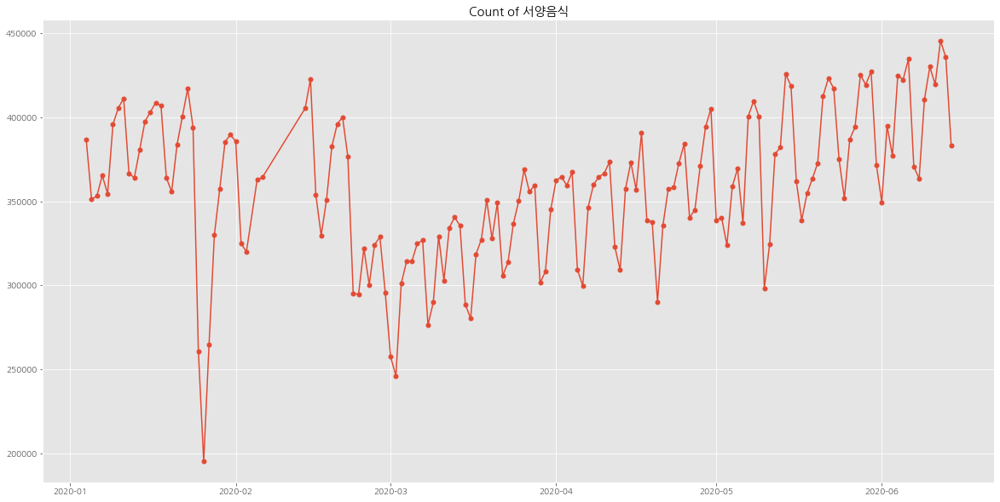

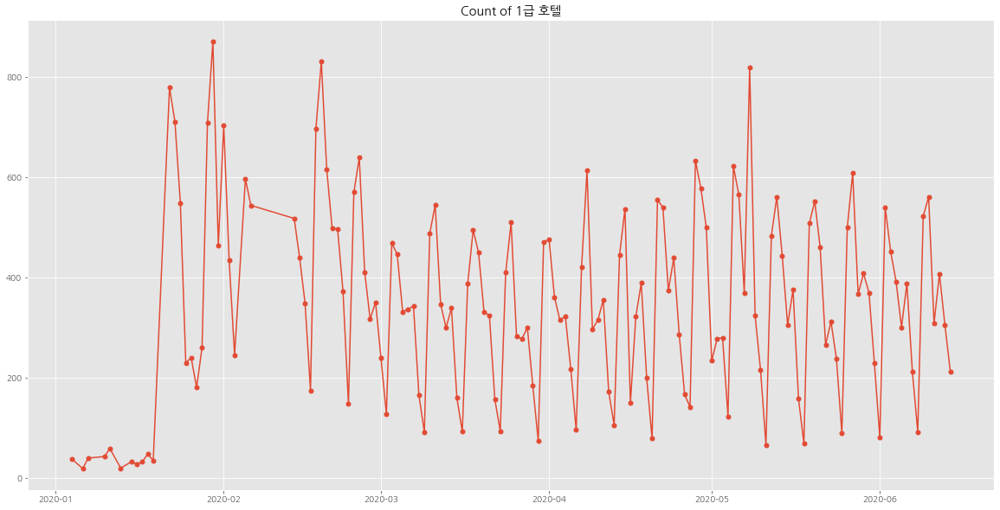

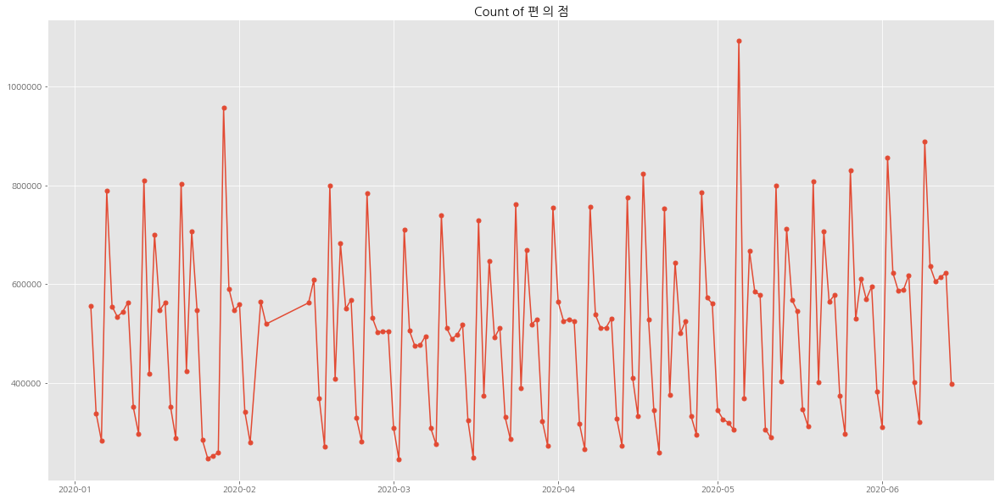

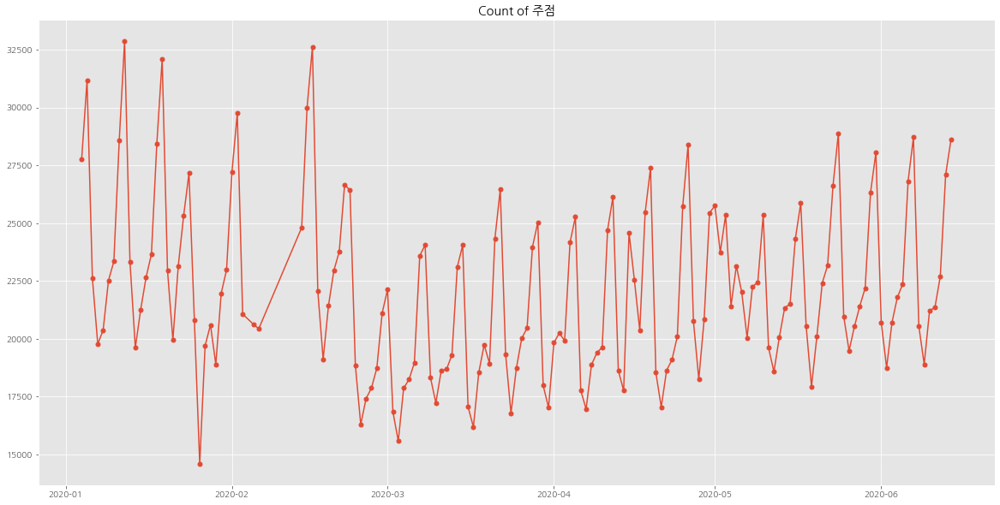

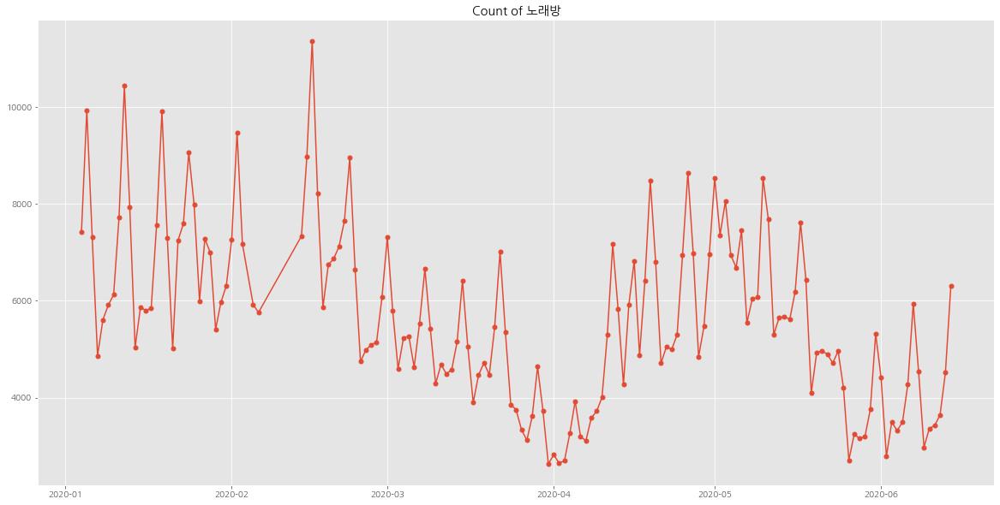

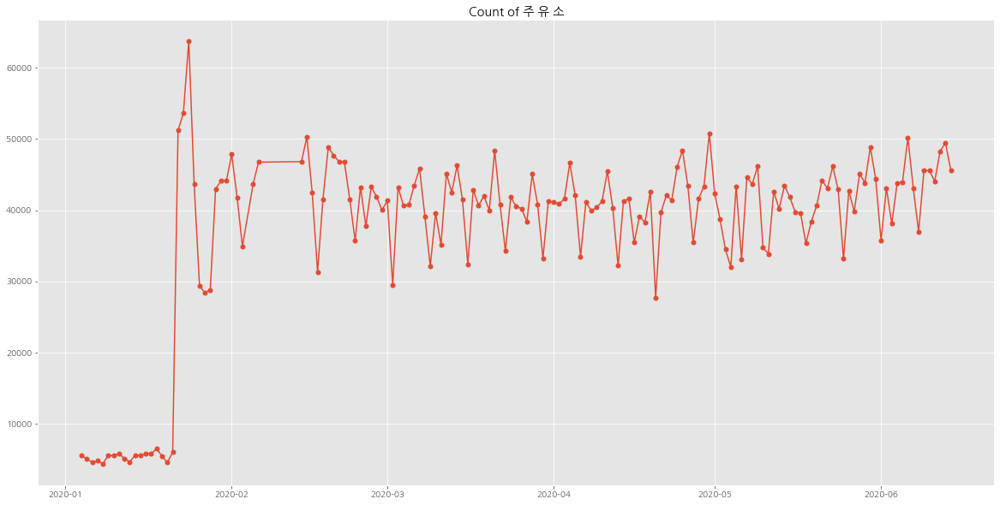

In [44]:
# 일부 가맹점마다의 방문횟수를 Day로 Groupby해준뒤 plot시각화해주기
Store = ['서양음식','1급 호텔','편 의 점','주점','노래방','주 유 소']

for i in Store:
    card_store = card[card['Store']== i ]

    card_store_new = card_store[['Date','Store','Count']]
    card_store_new[['Date']] = card_store_new[['Date']].applymap(str).applymap(lambda x: "{}-{}-{}".format(x[0:4], x[4:6], x[6:]))

    card_store_new['Day'] = pd.to_datetime(card_store_new['Date'])
    card_store_new.drop('Date', axis=1, inplace=True)

    card_store_sum = card_store_new['Count'].groupby([card_store_new['Day']]).sum()
    card_store_sum = pd.DataFrame(card_store_sum)

    plt.figure(figsize=(20,10))
    plt.style.use('ggplot')
    plt.title('Count of {0}'.format(i))
    plt.plot(card_store_sum, marker='o', markersize=5)

In [21]:
# 가맹점마다의 이용횟수 총합

card_a = card[['Store','Count']]
card_a.head()

,Store,Count
0,약국,463
1,치과의원,33
2,한의원,53
3,의원,339
4,자동차정비,19


In [22]:
# 가맹지 카테고리별 이용횟수 총합의 상위순서

card_a_sum = card_a['Count'].groupby([card_a['Store']]).sum()
card_a_sum = pd.DataFrame(card_a_sum)
card_a_sum = card_a_sum.sort_values(by=['Count'],ascending=False).reset_index()

card_a_sum.head(10)

,Store,Count
0,인터넷P/G,143656789
1,기타전문점,94616422
2,편 의 점,78501010
3,택 시,63392811
4,서양음식,55454301
5,일반한식,52135647
6,슈퍼 마켓,35080409
7,인터넷종합Mall,19480693
8,대형할인점,18071501
9,인터넷Mall,17564815


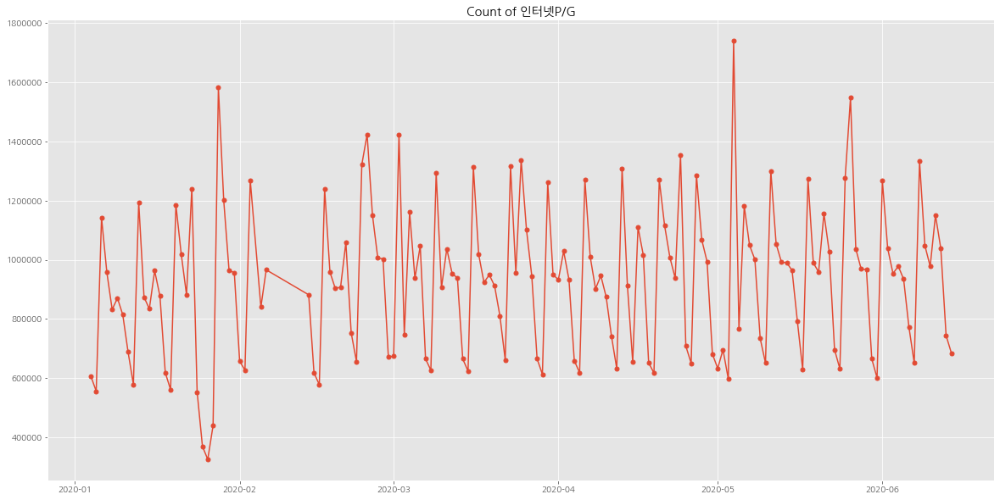

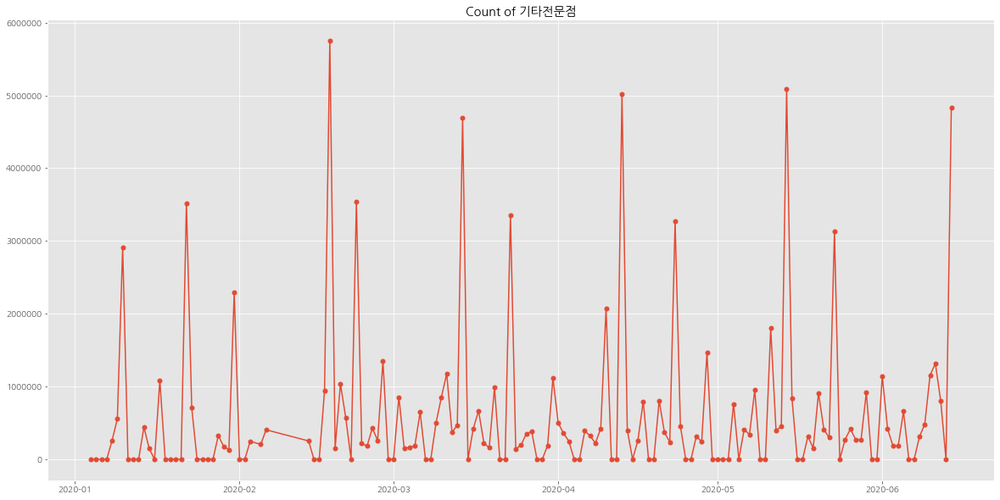

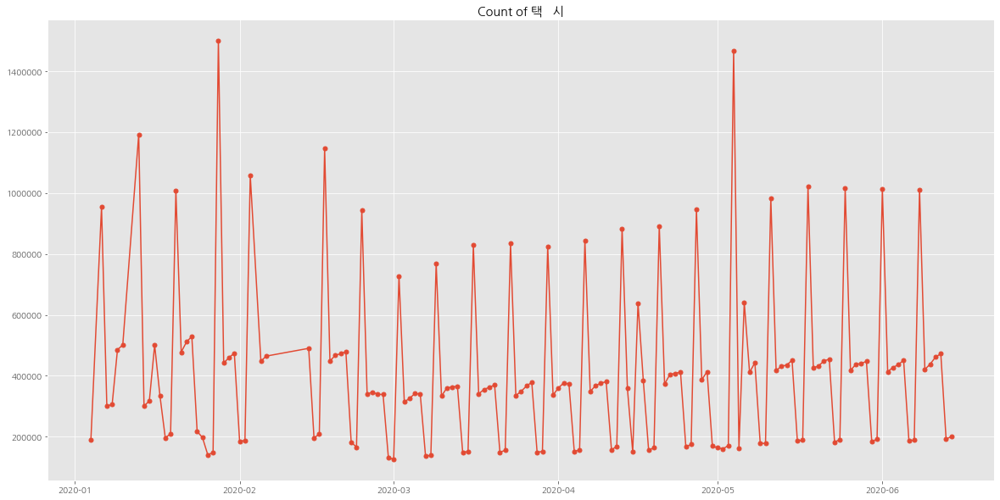

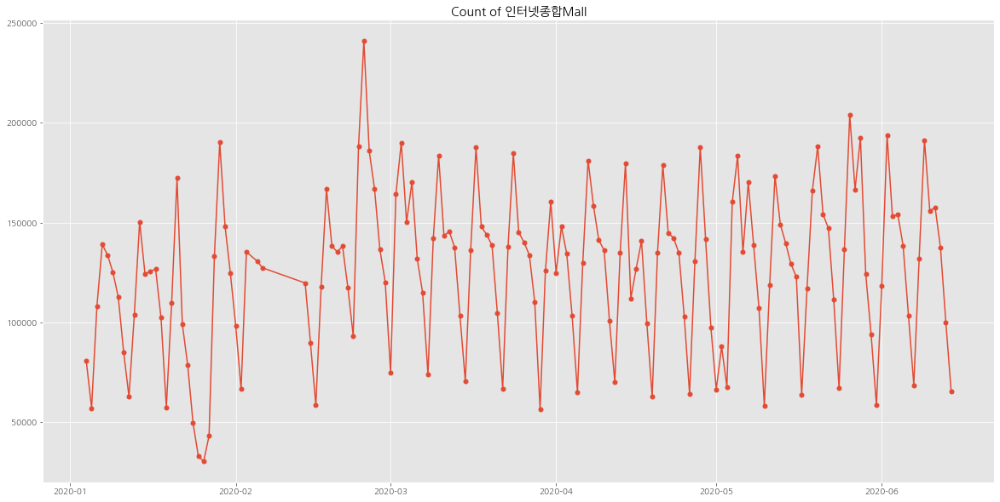

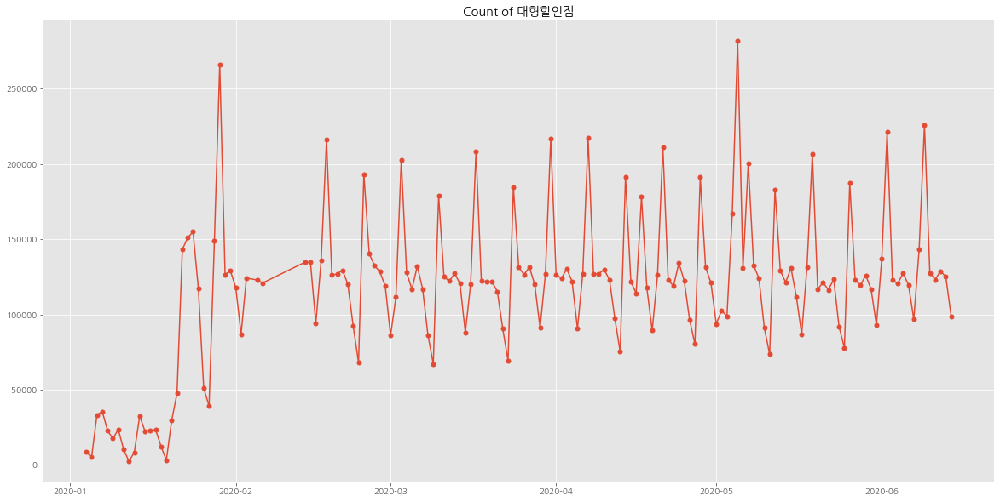

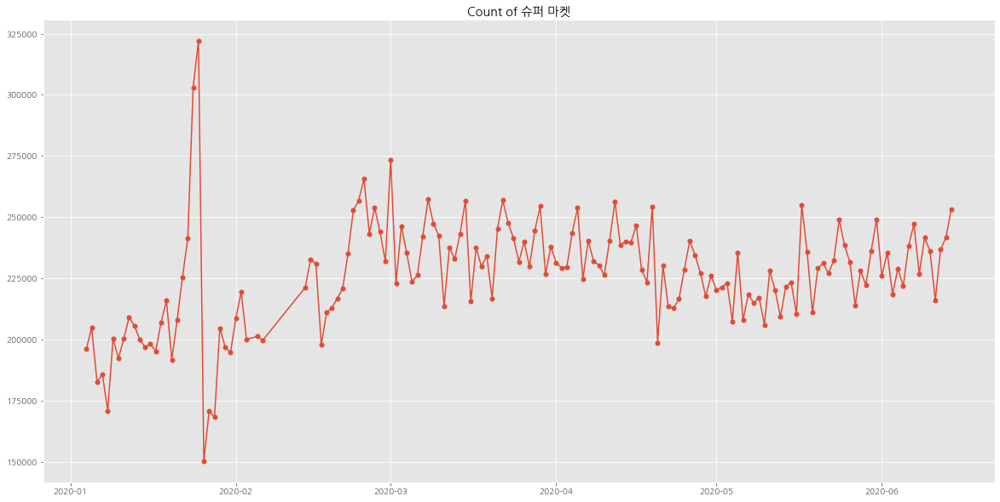

In [45]:
#상위순서의 연간 판매 ploting

Store = ['인터넷P/G','기타전문점','택   시','인터넷종합Mall','대형할인점','슈퍼 마켓']

for i in Store:
    card_store = card[card['Store']== i ]

    card_store_new = card_store[['Date','Store','Count']]
    card_store_new[['Date']] = card_store_new[['Date']].applymap(str).applymap(lambda x: "{}-{}-{}".format(x[0:4], x[4:6], x[6:]))

    card_store_new['Day'] = pd.to_datetime(card_store_new['Date'])
    card_store_new.drop('Date', axis=1, inplace=True)

    card_store_sum = card_store_new['Count'].groupby([card_store_new['Day']]).sum()
    card_store_sum = pd.DataFrame(card_store_sum)

    plt.figure(figsize=(20,10))
    plt.style.use('ggplot')
    plt.title('Count of {0}'.format(i))
    plt.plot(card_store_sum, marker='o', markersize=5)

In [24]:
# 10만건 이상의 이용한 가맹점의 카테고리만 필터링

card_b_sum = card_a_sum[card_a_sum['Count'] > 100000]

print(len(card_b_sum['Store'].unique()))
print(card_b_sum['Store'].unique())
card_b_sum.head(10)

119
['인터넷P/G' '기타전문점' '편 의 점' '택   시' '서양음식' '일반한식' '슈퍼 마켓' '인터넷종합Mall'
 '대형할인점' '인터넷Mall' '약국' '스넥' '제과점' '구내매점(국가기관등)' '연 쇄 점' '이동통신요금' '기타음료식품'
 '손해 보험' '기타레져업' '의원' '중국음식' '주 유 소' '자사카드발행백화점' '생명 보험' '주 차 장' '일식회집'
 '농축수산품' '종합병원' '정 육 점' '주점' '미 용 원' '상품권' '기타잡화' '공공요금/대상' '정장' '화물 운송'
 'CATV홈쇼핑' '문구용 품' '고속 버스' '화 장 품' '일반 서적' '비영리/비대상' '위탁급식업' '사무서비스'
 '스포츠레져용품' '조세서비스(특약)' '철   도' '한의원' '치과의원' '가전 제품' '통신판매(일반)' '공공 요금'
 '영화관' '노래방' '사우나' '비 영 리' '세탁소' '기타숙박업' '통신서비스/비대상' '당구장' '유아원' '특급 호텔'
 '화   원' '안경' 'PG 상품권' '병원' '기계 공구' 'L P G' '항 공 사' '자동차정비' '종합용역' '출판인쇄물'
 '악세 사리' '동물병원' '소프트웨어' '보습학원' '장례서비스' '기타사무용품' '통신판매1' '여 객 선' '애완 동물'
 '내의판매점' '학습지교육' '유흥주점' '기타유통업' '볼 링 장' '컴 퓨 터' '칵테일바' '가정용품수리'
 '학원(회원제형태)' '기타건축자재' '레져업소(회원제형태)' '정 수 기' '조세서비스' '스크린골프' '완 구 점'
 '사무통신기기수리' '단란주점' '골프연습장' '기타용역서비스' '헬스 크럽' '사무 기기' '기타의류' '의료 용품'
 '일반백화점' '기타회원제형태업소4' '사진관' '티켓' '기타전기제품' '피부미용실' '전문 서적' '자동차부품' '주방 용구'
 '통신 기기' '예체능학원' '위성방송' '기타가구' '부동산중개/임대' '신   발']


,Store,Count
0,인터넷P/G,143656789
1,기타전문점,94616422
2,편 의 점,78501010
3,택 시,63392811
4,서양음식,55454301
5,일반한식,52135647
6,슈퍼 마켓,35080409
7,인터넷종합Mall,19480693
8,대형할인점,18071501
9,인터넷Mall,17564815


In [25]:
#필터링된 가맹점리스트
Store_value = list(card_b_sum['Store'])

In [26]:
# Day컬럼이 포함된 빈 데이터프레임생성

card_big = card_new[card_new['Store'] == None]
card_big.head()

,Store,Count,Day


In [27]:
# 빈데이터프레임에 날짜가 포함되게 더해줌

for i in Store_value:
    card_huge = card_new[card_new['Store'] == i]
    card_big = pd.merge(card_big, card_huge,how='outer')

card_big.head()

,Store,Count,Day
0,인터넷P/G,366,2020-01-04
1,인터넷P/G,1464,2020-01-04
2,인터넷P/G,26808,2020-01-04
3,인터넷P/G,7980,2020-01-04
4,인터넷P/G,4932,2020-01-04


In [28]:
# 추석과 직접적으로 관련된 연휴라고 볼 수 있는 설날에 대해서 데이터 분석
# 2020년 설날초기(1/23~25), 설날중반(1/24~26), 설날후기(1/25~27) 각각 필터링

card_seol_s = card_big[(card_big["Day"] == '2020-01-23') | (card_big["Day"] == '2020-01-24') | 
            (card_big["Day"] == '2020-01-25')]

card_seol_m = card_big[(card_big["Day"] == '2020-01-24') | (card_big["Day"] == '2020-01-25') | 
            (card_big["Day"] == '2020-01-26')]

card_seol_f = card_big[(card_big["Day"] == '2020-01-25') | (card_big["Day"] == '2020-01-26') | 
            (card_big["Day"] == '2020-01-27')]

In [29]:
# 날짜컬럼을 제외

card_seol_s_a = card_seol_s.drop(['Day'],axis=1)
card_seol_m_a = card_seol_m.drop(['Day'],axis=1)
card_seol_f_a = card_seol_f.drop(['Day'],axis=1)

#전체데이터에서도 날짜걸럼제외

card_big_a = card_big.drop(['Day'],axis=1)

In [30]:
# Count수를 Store별로 Groupby시켜 모든 날짜의 방문객수를 총합

card_seol_s_sum = pd.DataFrame(card_seol_s_a['Count'].groupby([card_seol_s_a['Store']]).sum())
card_seol_m_sum = pd.DataFrame(card_seol_m_a['Count'].groupby([card_seol_m_a['Store']]).sum())
card_seol_f_sum = pd.DataFrame(card_seol_f_a['Count'].groupby([card_seol_f_a['Store']]).sum())

card_big_sum = pd.DataFrame(card_big_a['Count'].groupby([card_big_a['Store']]).sum())

In [31]:
# 설기간동안의 평균(나누기3)을 구해줌(설기간동안 평균적인 이용률을 보기 위함)

card_seol_s_sum = card_seol_s_sum.rename({'Count':'Count_Seol'}, axis='columns')
card_seol_s_sum = card_seol_s_sum.sort_values(by=['Count_Seol'],ascending=False).reset_index()
card_seol_s_sum['Count_Seol_Mean']=card_seol_s_sum['Count_Seol']/3

card_seol_m_sum = card_seol_m_sum.rename({'Count':'Count_Seol'}, axis='columns')
card_seol_m_sum = card_seol_m_sum.sort_values(by=['Count_Seol'],ascending=False).reset_index()
card_seol_m_sum['Count_Seol_Mean']=card_seol_m_sum['Count_Seol']/3

card_seol_f_sum = card_seol_f_sum.rename({'Count':'Count_Seol'}, axis='columns')
card_seol_f_sum = card_seol_f_sum.sort_values(by=['Count_Seol'],ascending=False).reset_index()
card_seol_f_sum['Count_Seol_Mean']=card_seol_f_sum['Count_Seol']/3

In [33]:
# 전체데이터 역시 전체날짜로 나눠서 평균을 구해줌(전체적인 평균 이용률을 보기 위함)

card_big_sum = card_big_sum.sort_values(by=['Count'],ascending=False).reset_index()
card_big_sum['Count_Mean']=card_big_sum['Count']/len(card_new['Day'].value_counts())
card_big_sum.head()

,index,Store,Count,Count_Mean
0,0,인터넷P/G,143656789,926817.993548
1,1,기타전문점,94616422,610428.529032
2,2,편 의 점,78501010,506458.129032
3,3,택 시,63392811,408985.877419
4,4,서양음식,55454301,357769.683871


In [34]:
#전체데이터와 설기간데이터프레임을 합침

card_vs_s = pd.merge(card_big_sum,card_seol_s_sum, on='Store')
card_vs_m = pd.merge(card_big_sum,card_seol_f_sum, on='Store')
card_vs_f = pd.merge(card_big_sum,card_seol_f_sum, on='Store')

In [35]:
#Std컬럼으로 '(설기간평균-전체기간평균)/전체기간평균'을 구함

card_vs_s['Std'] = (card_vs_s['Count_Seol_Mean']-card_vs_s['Count_Mean'])/card_vs_s['Count_Mean']
card_vs_s = card_vs_s.sort_values(by=['Std'],ascending=False)

card_vs_m['Std'] = (card_vs_m['Count_Seol_Mean']-card_vs_m['Count_Mean'])/card_vs_m['Count_Mean']
card_vs_m = card_vs_m.sort_values(by=['Std'],ascending=False)

card_vs_f['Std'] = (card_vs_f['Count_Seol_Mean']-card_vs_f['Count_Mean'])/card_vs_f['Count_Mean']
card_vs_f = card_vs_f.sort_values(by=['Std'],ascending=False)


In [36]:
#설초반 카드데이터건수가 높은 지수 상위 20(설 초반에 이용률이 높은 가맹점 카테고리를 알 수 있음)

card_vs_s.head(20)

,index,Store,Count,Count_Mean,Count_Seol,Count_Seol_Mean,Std
92,92,정 수 기,200899,1296.122581,29126,9708.666667,6.490547
74,74,소프트웨어,359832,2321.496774,32249,10749.666667,3.630490
110,110,전문 서적,123181,794.716129,9823,3274.333333,3.120129
93,93,조세서비스,195470,1261.096774,10086,3362.000000,1.665933
52,52,영화관,940426,6067.264516,44634,14878.000000,1.452176
54,54,사우나,874782,5643.754839,40874,13624.666667,1.414114
28,28,정 육 점,3465574,22358.541935,157164,52388.000000,1.343087
83,83,유흥주점,258671,1668.845161,10876,3625.333333,1.172361
38,38,고속 버스,1882166,12143.006452,77972,25990.666667,1.140382
45,45,조세서비스(특약),1317554,8500.348387,52724,17574.666667,1.067523


In [37]:
#설중반기간 카드데이터건수가 높은 지수 상위 20(설 중반에 이용률이 높은 가맹점 카테고리를 알 수 있음)

card_vs_m.head(20)

,index,Store,Count,Count_Mean,Count_Seol,Count_Seol_Mean,Std
106,107,티켓,141856,915.200000,8745,2915.000000,2.185096
53,54,사우나,874782,5643.754839,44047,14682.333333,1.601519
60,61,특급 호텔,559507,3609.722581,26110,8703.333333,1.411081
115,116,기타가구,109527,706.625806,4991,1663.666667,1.354381
82,83,유흥주점,258671,1668.845161,10688,3562.666667,1.134810
51,52,영화관,940426,6067.264516,38675,12891.666667,1.124791
38,38,고속 버스,1882166,12143.006452,74339,24779.666667,1.040653
84,85,볼 링 장,246848,1592.567742,8112,2704.000000,0.697887
95,96,사무통신기기수리,186809,1205.219355,5367,1789.000000,0.484377
18,18,기타레져업,7630200,49227.096774,217120,72373.333333,0.470193


In [38]:
#설후반 카드데이터건수가 높은 지수 상위 20(설 후반에 이용률이 높은 가맹점 카테고리를 알 수 있음)

card_vs_f.head(20)

,index,Store,Count,Count_Mean,Count_Seol,Count_Seol_Mean,Std
106,107,티켓,141856,915.200000,8745,2915.000000,2.185096
53,54,사우나,874782,5643.754839,44047,14682.333333,1.601519
60,61,특급 호텔,559507,3609.722581,26110,8703.333333,1.411081
115,116,기타가구,109527,706.625806,4991,1663.666667,1.354381
82,83,유흥주점,258671,1668.845161,10688,3562.666667,1.134810
51,52,영화관,940426,6067.264516,38675,12891.666667,1.124791
38,38,고속 버스,1882166,12143.006452,74339,24779.666667,1.040653
84,85,볼 링 장,246848,1592.567742,8112,2704.000000,0.697887
95,96,사무통신기기수리,186809,1205.219355,5367,1789.000000,0.484377
18,18,기타레져업,7630200,49227.096774,217120,72373.333333,0.470193


In [39]:
#설초반 Std가 0.2보다 높은 가맹점별 카테고리 리스트
card_real_s = card_vs_s[card_vs_s['Std'] > 0.2]
List_s = list(card_real_s['Store'])
List_s

['정 수 기',
 '소프트웨어',
 '전문 서적',
 '조세서비스',
 '영화관',
 '사우나',
 '정 육 점',
 '유흥주점',
 '고속 버스',
 '조세서비스(특약)',
 '티켓',
 '특급 호텔',
 '농축수산품',
 '기타가구',
 '항 공 사',
 '유아원',
 '공공요금/대상',
 '사무통신기기수리',
 '헬스 크럽',
 '자사카드발행백화점',
 '노래방',
 '단란주점',
 '주 유 소',
 '기타레져업',
 'L P G',
 '철   도',
 '기타회원제형태업소4',
 '종합병원',
 '완 구 점',
 '볼 링 장',
 '통신 기기',
 '손해 보험',
 '애완 동물',
 '악세 사리',
 '슈퍼 마켓',
 '기타음료식품',
 '내의판매점',
 '구내매점(국가기관등)',
 '미 용 원',
 '상품권',
 '부동산중개/임대',
 '대형할인점',
 '병원',
 '의원']

In [40]:
#설중반 Std가 0.2보다 높은 가맹점별 카테고리 리스트
card_real_m = card_vs_m[card_vs_m['Std'] > 0.2]
List_m = list(card_real_m['Store'])
List_m

['티켓',
 '사우나',
 '특급 호텔',
 '기타가구',
 '유흥주점',
 '영화관',
 '고속 버스',
 '볼 링 장',
 '사무통신기기수리',
 '기타레져업',
 '여 객 선',
 '일반백화점',
 '완 구 점',
 '노래방',
 '기타회원제형태업소4']

In [41]:
#설후반 Std가 0.2보다 높은 가맹점별 카테고리 리스트
card_real_f = card_vs_f[card_vs_f['Std'] > 0.2]
List_f = list(card_real_f['Store'])
List_f

['티켓',
 '사우나',
 '특급 호텔',
 '기타가구',
 '유흥주점',
 '영화관',
 '고속 버스',
 '볼 링 장',
 '사무통신기기수리',
 '기타레져업',
 '여 객 선',
 '일반백화점',
 '완 구 점',
 '노래방',
 '기타회원제형태업소4']

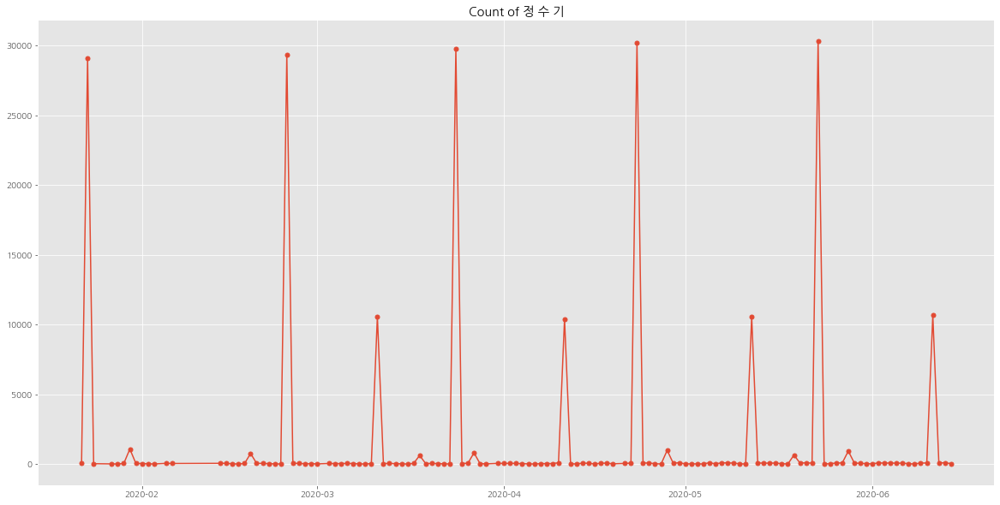

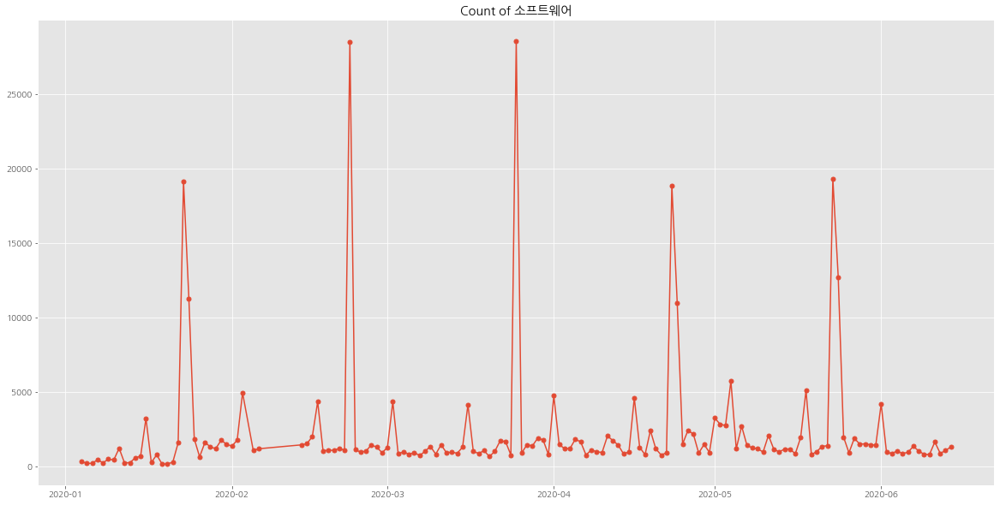

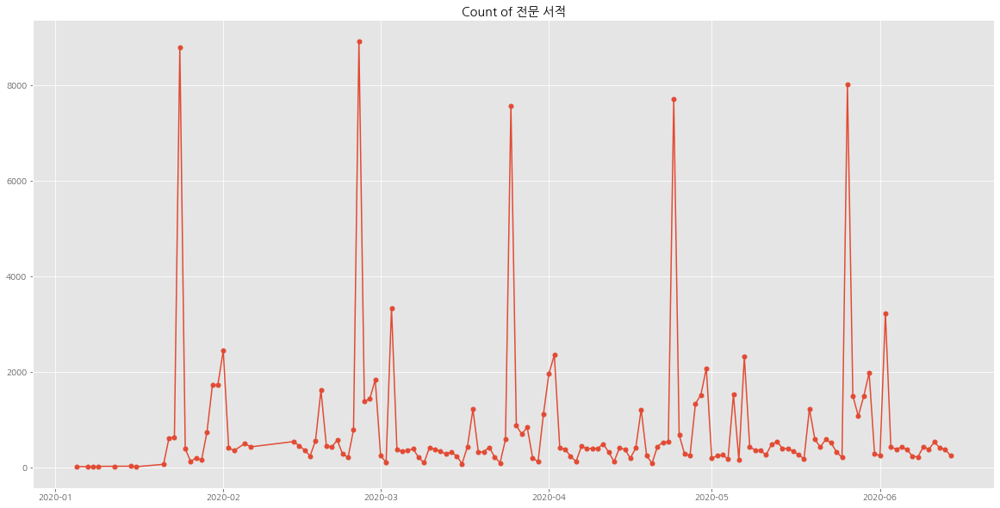

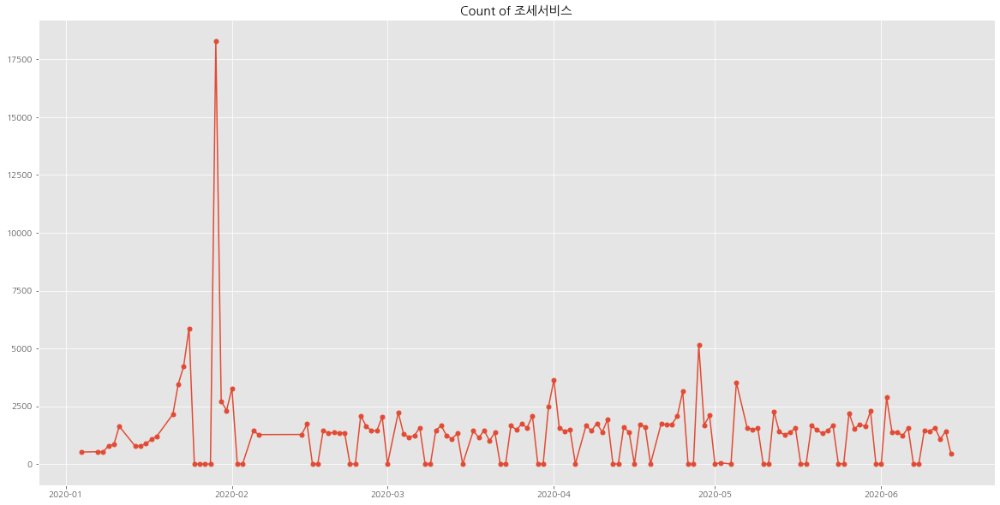

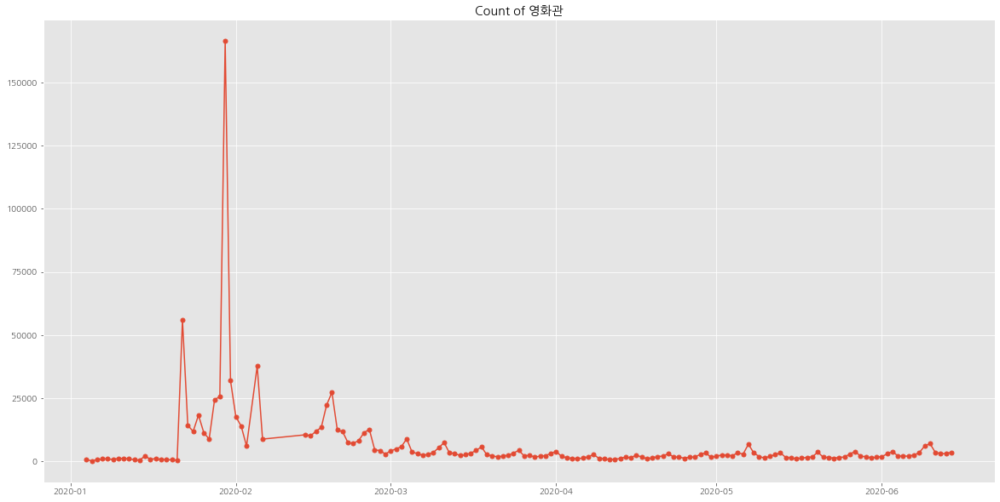

...

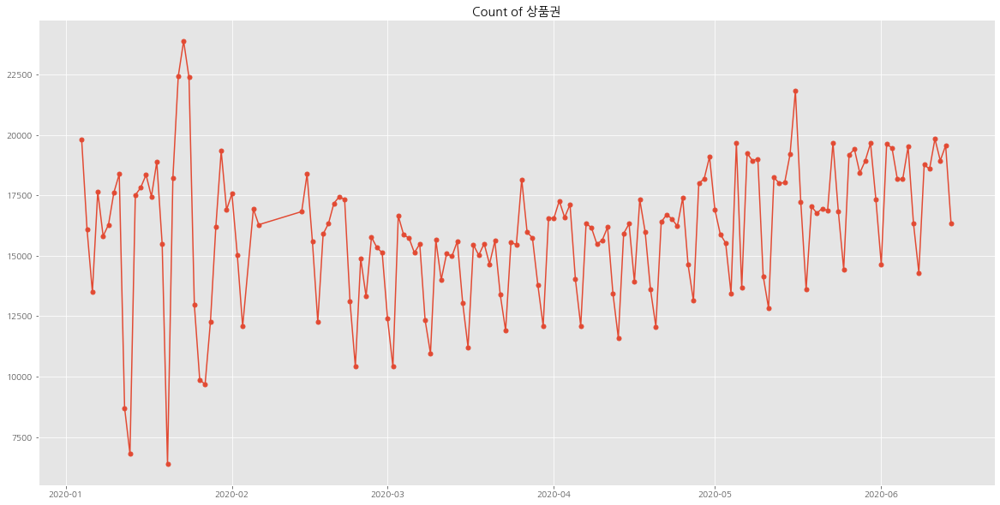

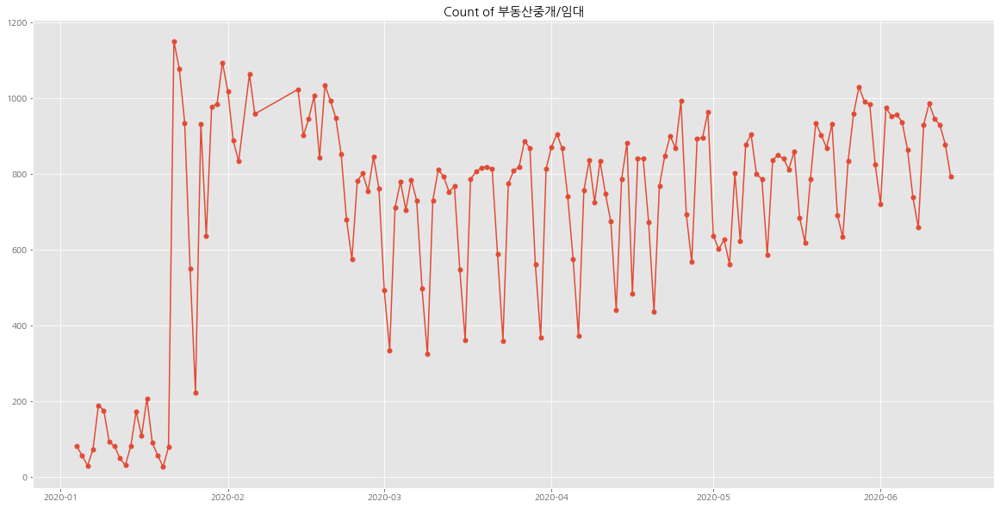

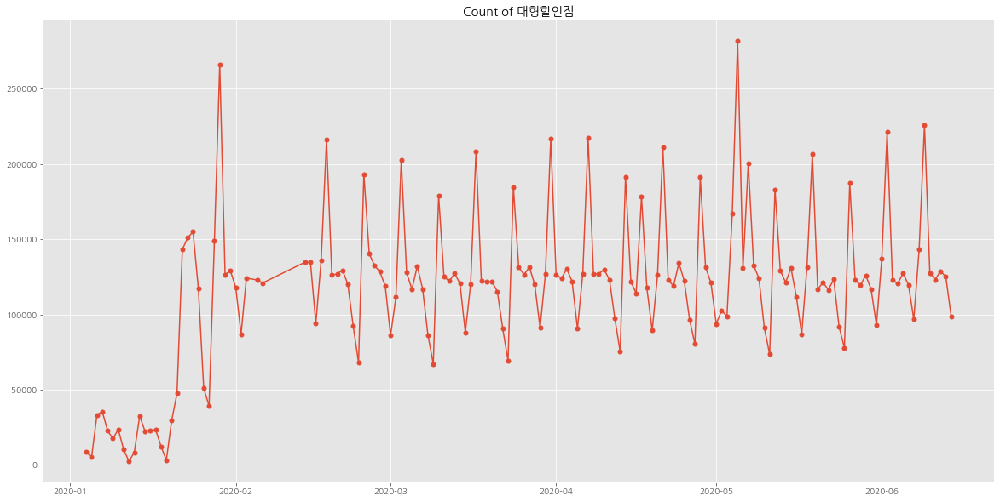

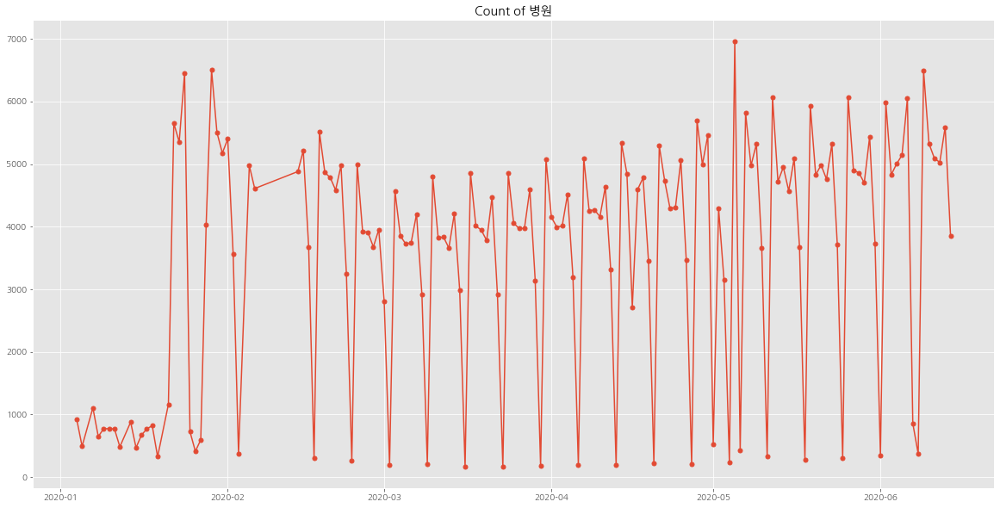

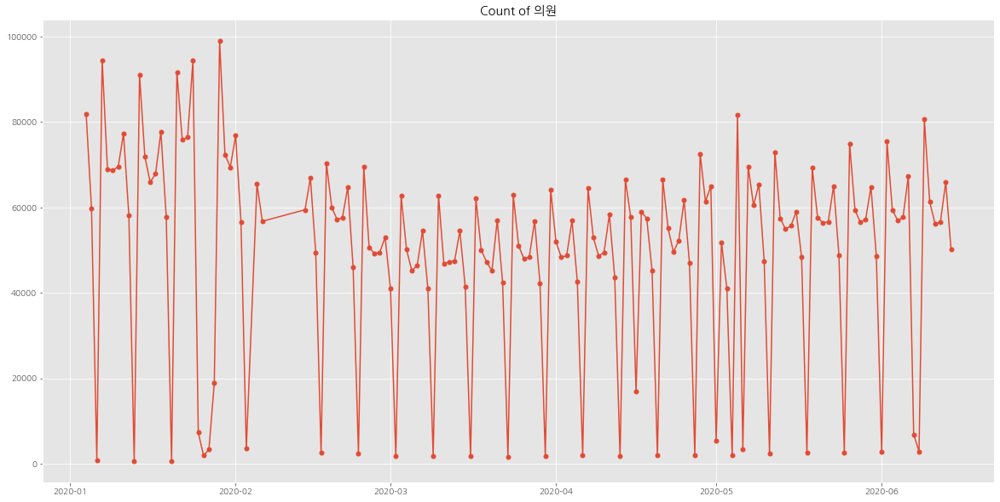

In [46]:
#설초반 이융률이 높은 가맹점별 카테고리 리스트 ploting

for i in List_s:
    card_store = card[card['Store']== i ]

    card_store_new = card_store[['Date','Store','Count']]
    card_store_new[['Date']] = card_store_new[['Date']].applymap(str).applymap(lambda x: "{}-{}-{}".format(x[0:4], x[4:6], x[6:]))

    card_store_new['Day'] = pd.to_datetime(card_store_new['Date'])
    card_store_new.drop('Date', axis=1, inplace=True)

    card_store_sum = card_store_new['Count'].groupby([card_store_new['Day']]).sum()
    card_store_sum = pd.DataFrame(card_store_sum)

    plt.figure(figsize=(20,10))
    plt.style.use('ggplot')
    plt.title('Count of {0}'.format(i))
    plt.plot(card_store_sum, marker='o', markersize=5)

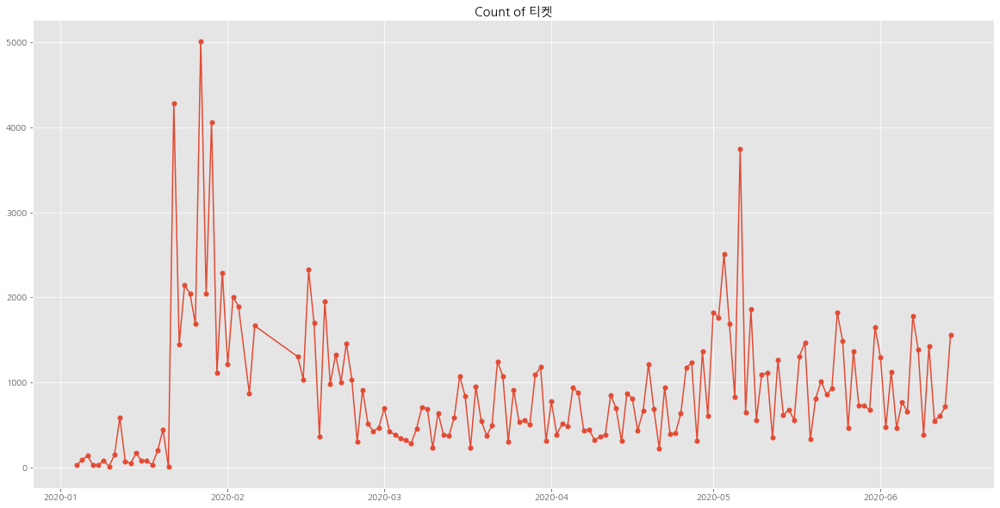

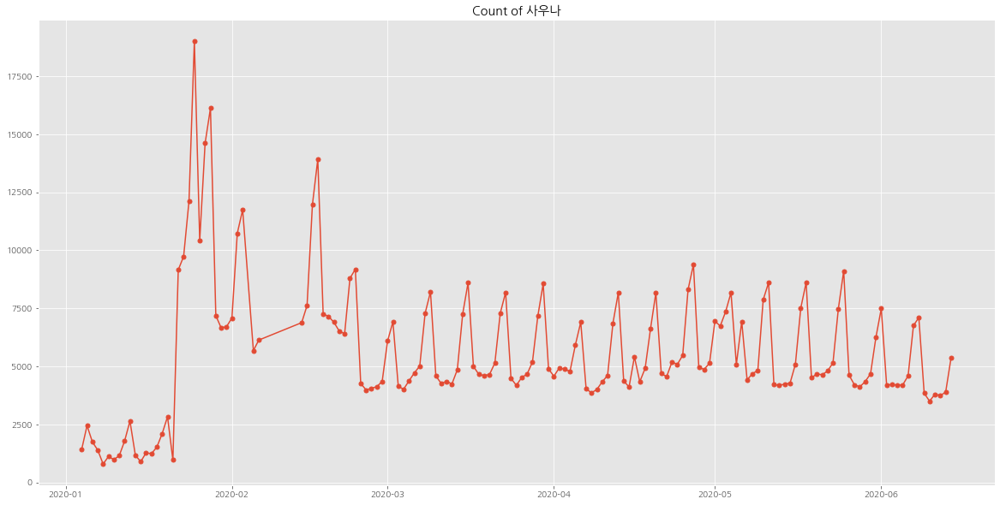

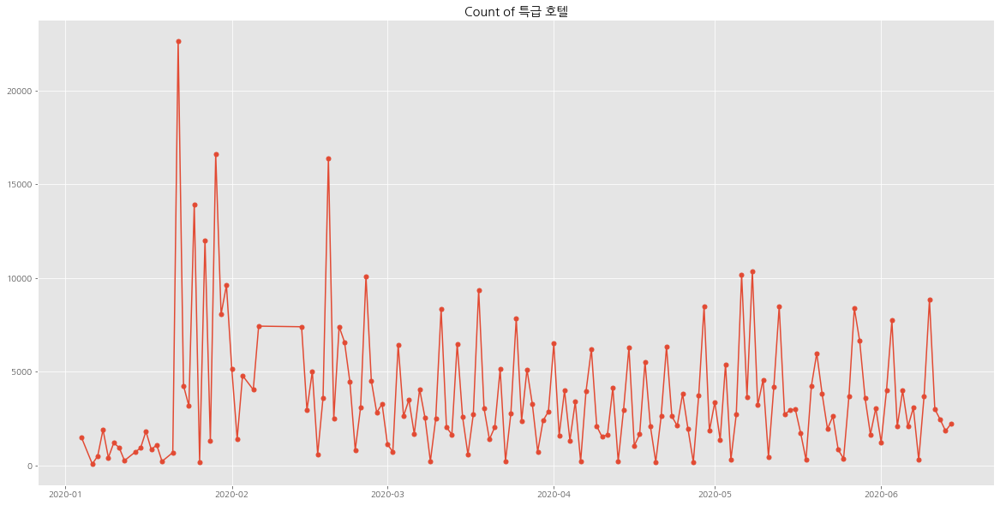

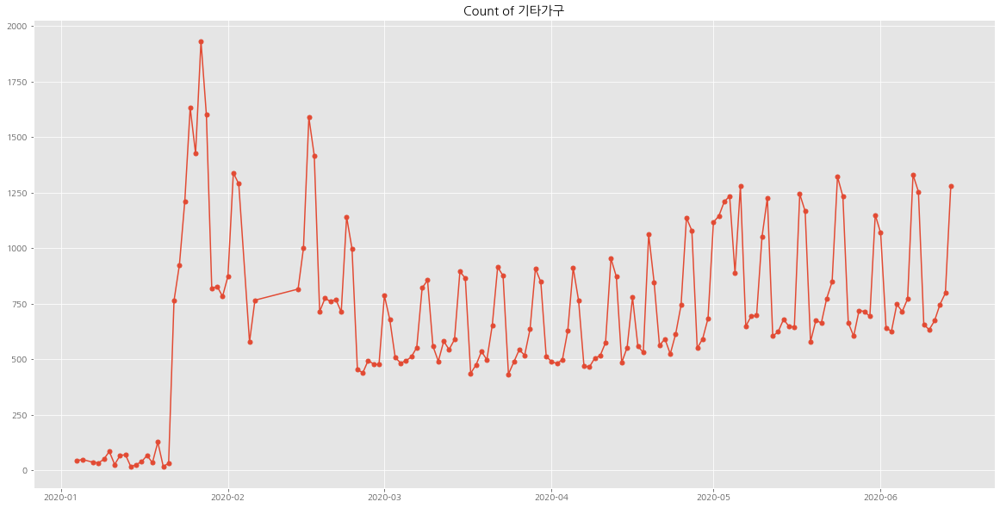

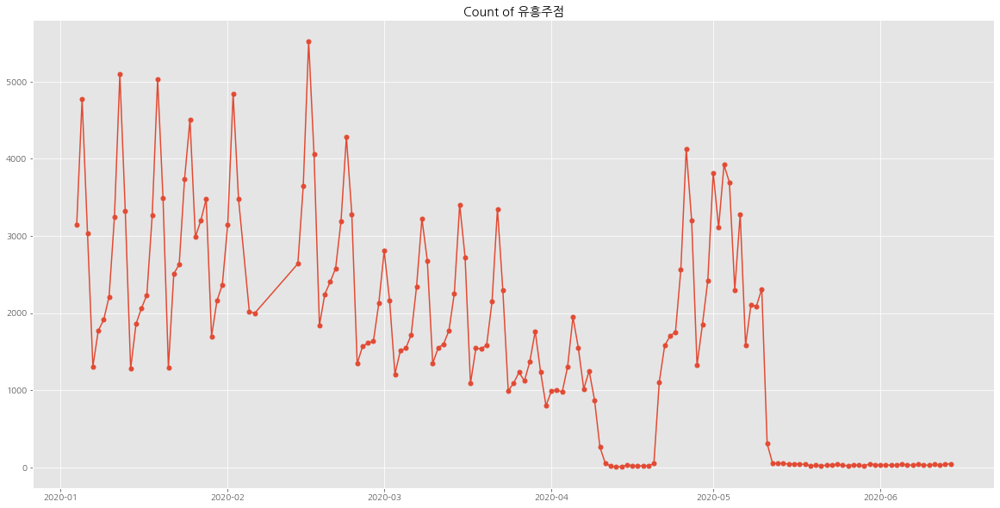

...

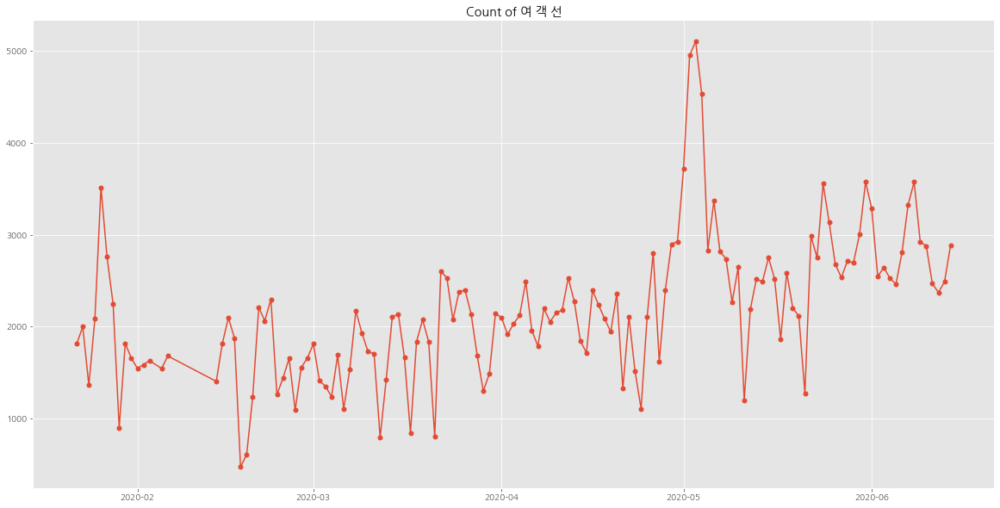

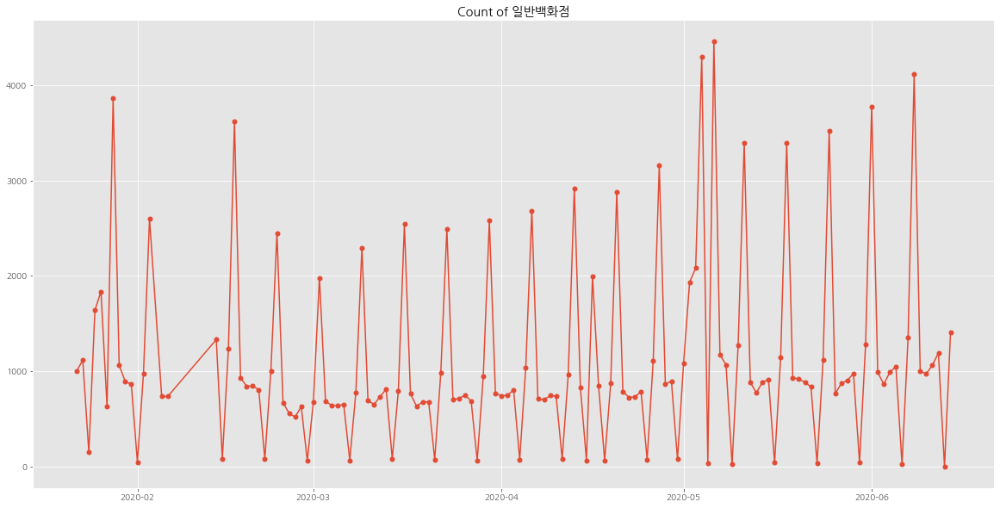

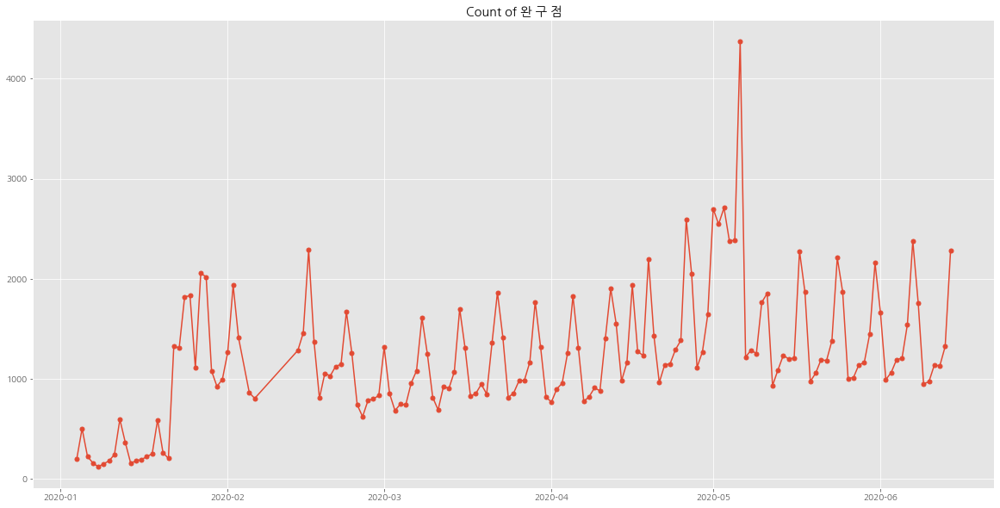

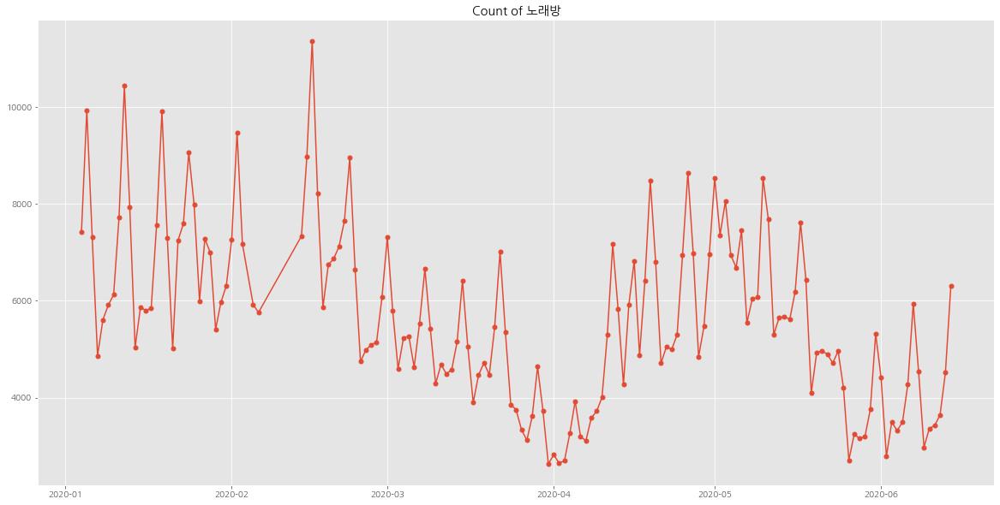

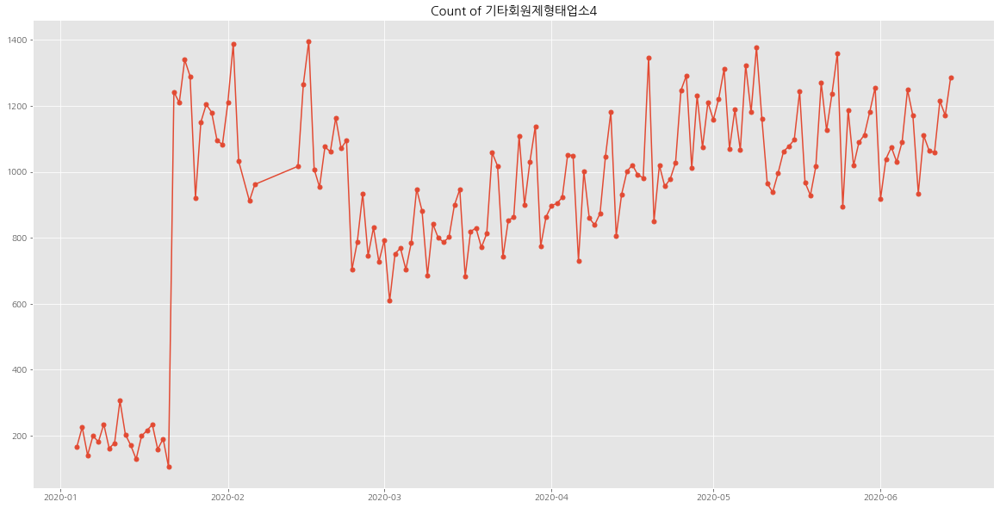

In [47]:
#설중반 Count가 높은가맹점 리스트 ploting
for i in List_m:
    card_store = card[card['Store']== i ]

    card_store_new =card_store[['Date','Store','Count']]
    card_store_new[['Date']] = card_store_new[['Date']].applymap(str).applymap(lambda x: "{}-{}-{}".format(x[0:4], x[4:6], x[6:]))

    card_store_new['Day'] = pd.to_datetime(card_store_new['Date'])
    card_store_new.drop('Date', axis=1, inplace=True)

    card_store_sum = card_store_new['Count'].groupby([card_store_new['Day']]).sum()
    card_store_sum = pd.DataFrame(card_store_sum)

    plt.figure(figsize=(20,10))
    plt.style.use('ggplot')
    plt.title('Count of {0}'.format(i))
    plt.plot(card_store_sum, marker='o', markersize=5)

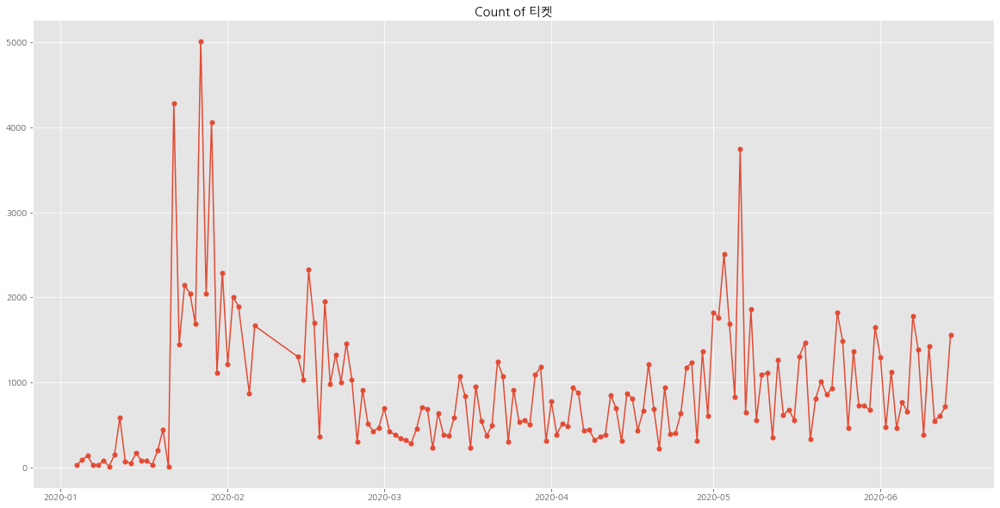

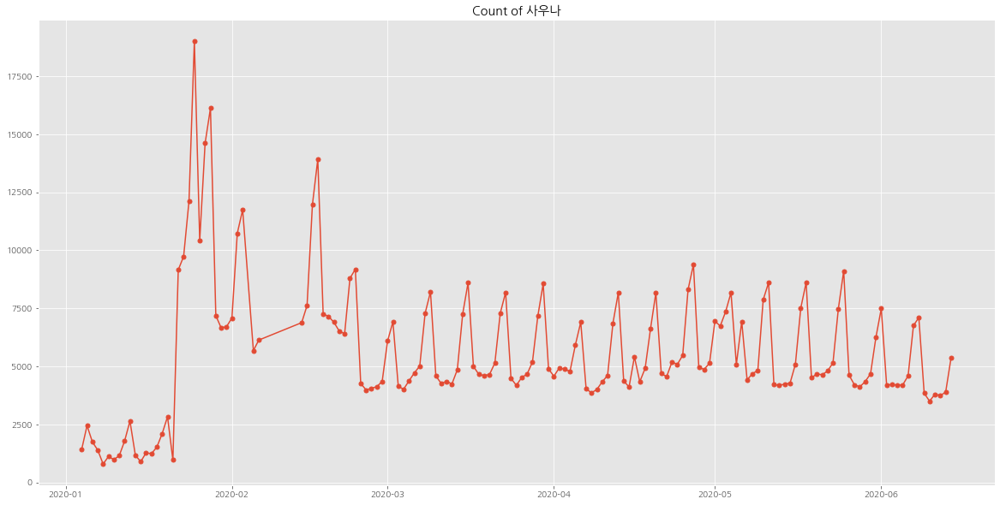

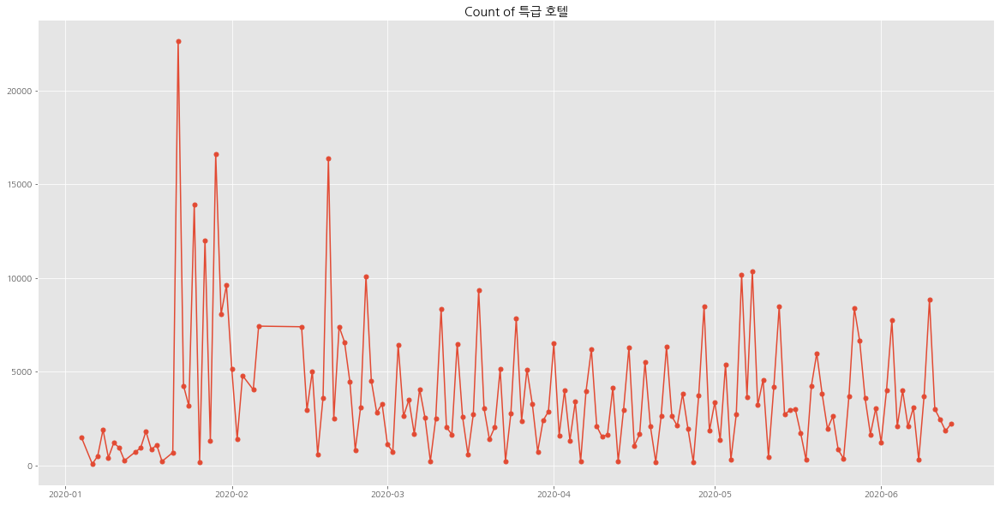

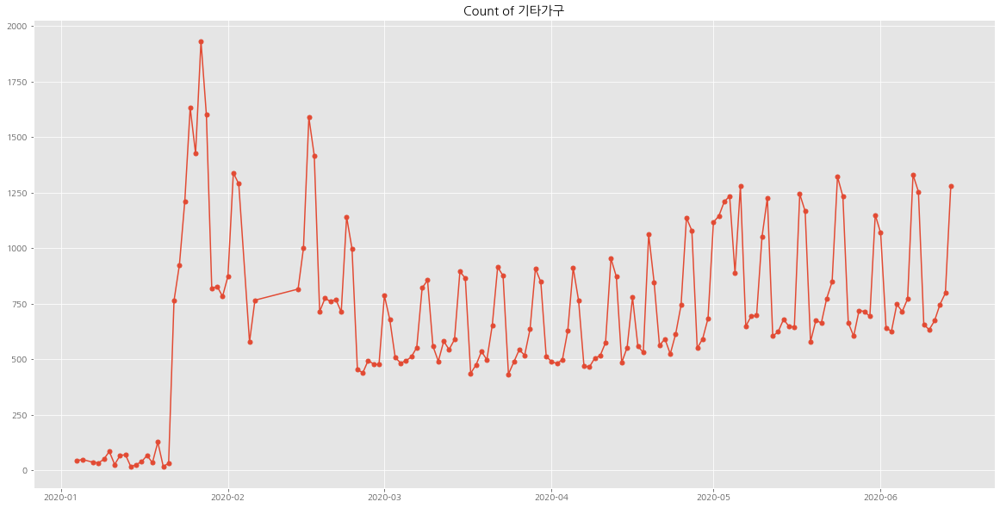

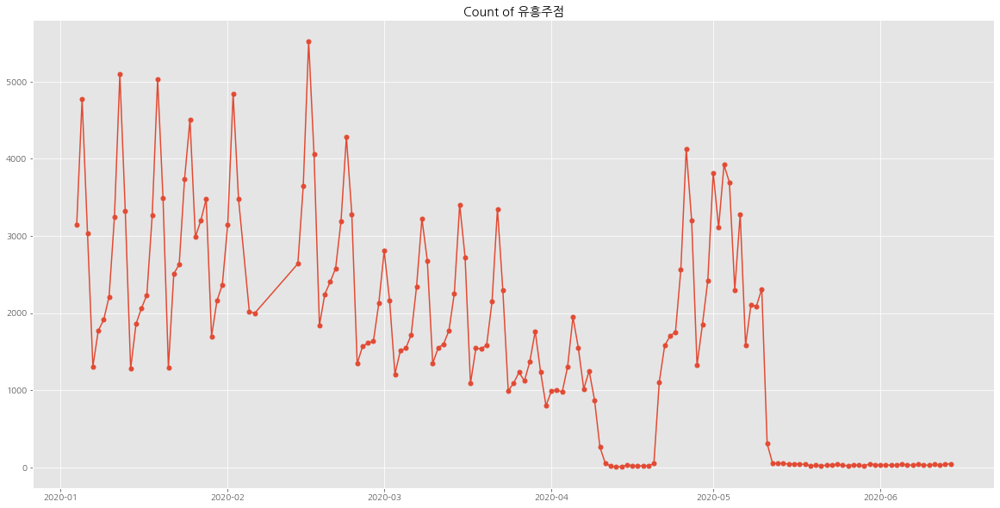

...

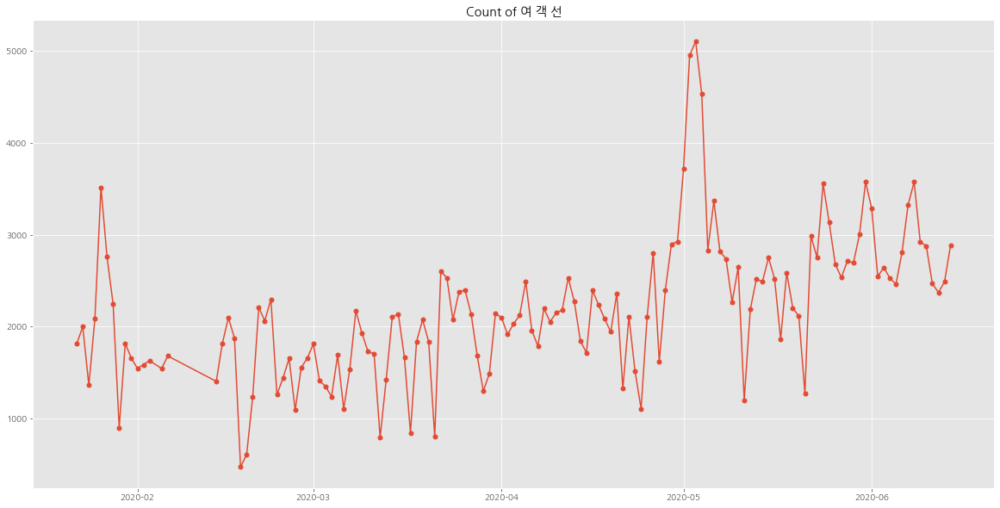

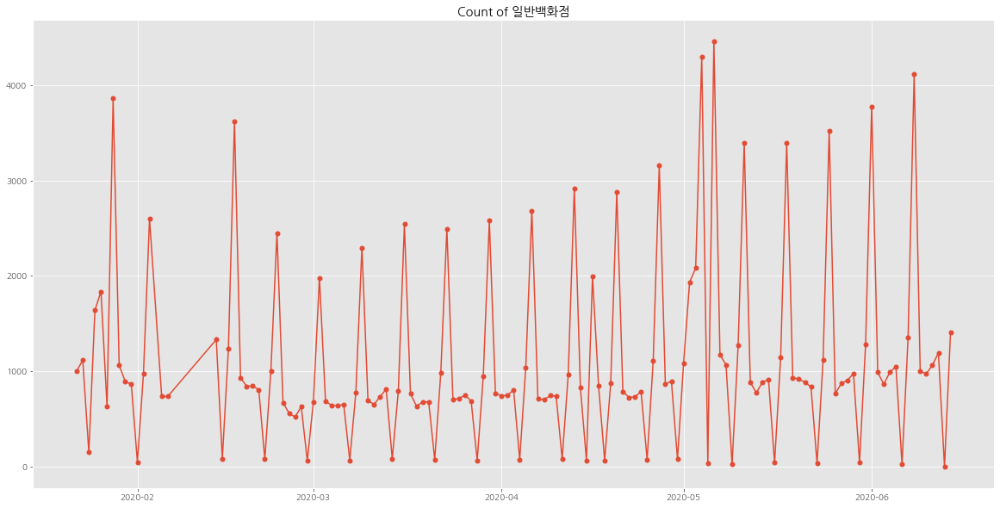

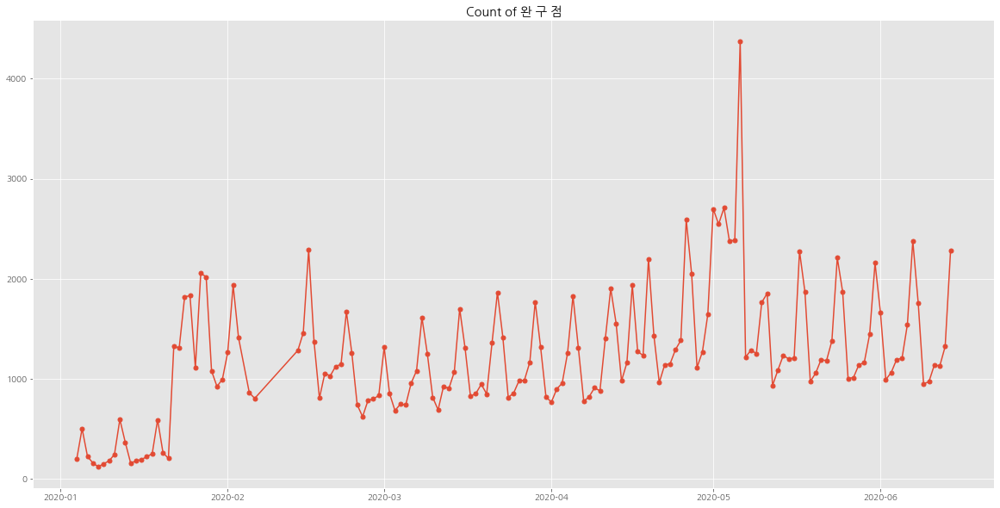

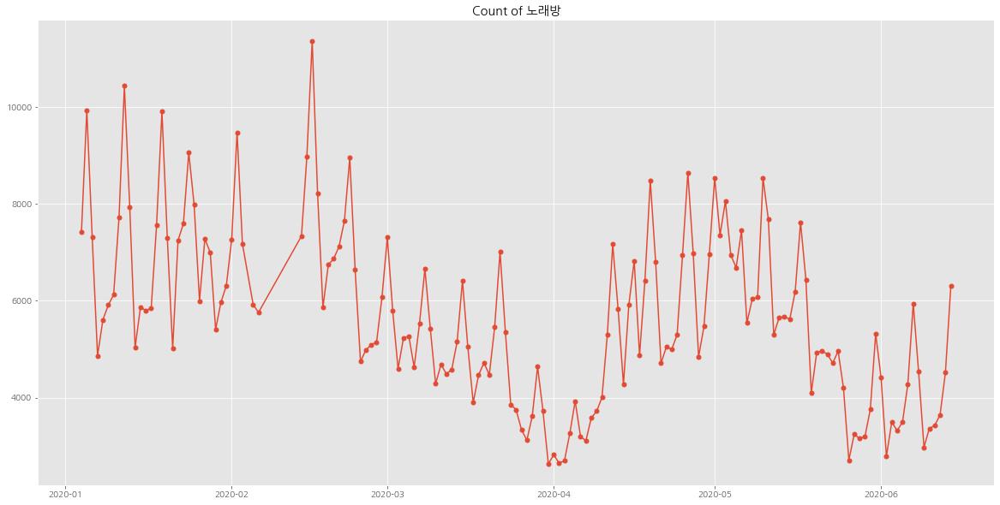

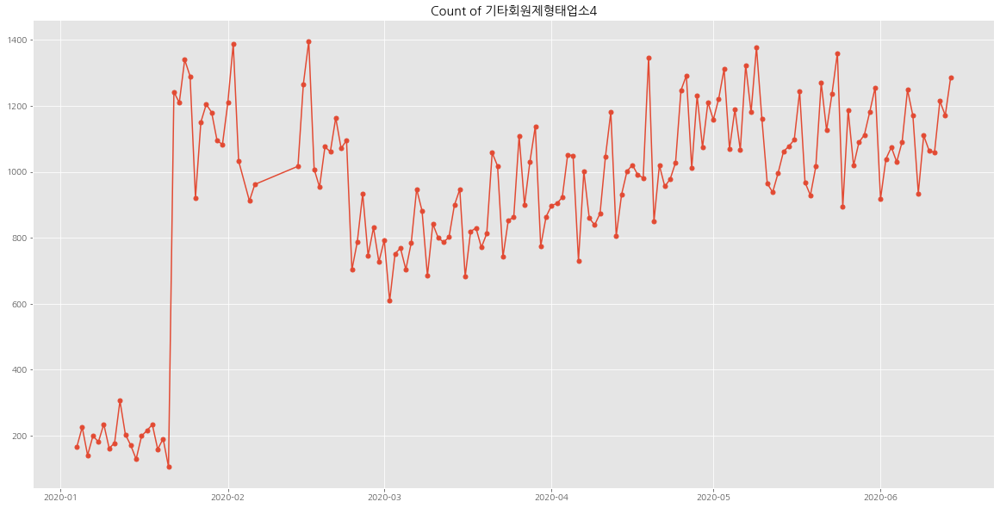

In [48]:
#설후반 Count가 높은가맹점 리스트 plotting
for i in List_f:
    card_store = card[card['Store']== i ]

    card_store_new = card_store[['Date','Store','Count']]
    card_store_new[['Date']] = card_store_new[['Date']].applymap(str).applymap(lambda x: "{}-{}-{}".format(x[0:4], x[4:6], x[6:]))

    card_store_new['Day'] = pd.to_datetime(card_store_new['Date'])
    card_store_new.drop('Date', axis=1, inplace=True)

    card_store_sum = card_store_new['Count'].groupby([card_store_new['Day']]).sum()
    card_store_sum = pd.DataFrame(card_store_sum)

    plt.figure(figsize=(20,10))
    plt.style.use('ggplot')
    plt.title('Count of {0}'.format(i))
    plt.plot(card_store_sum, marker='o', markersize=5)

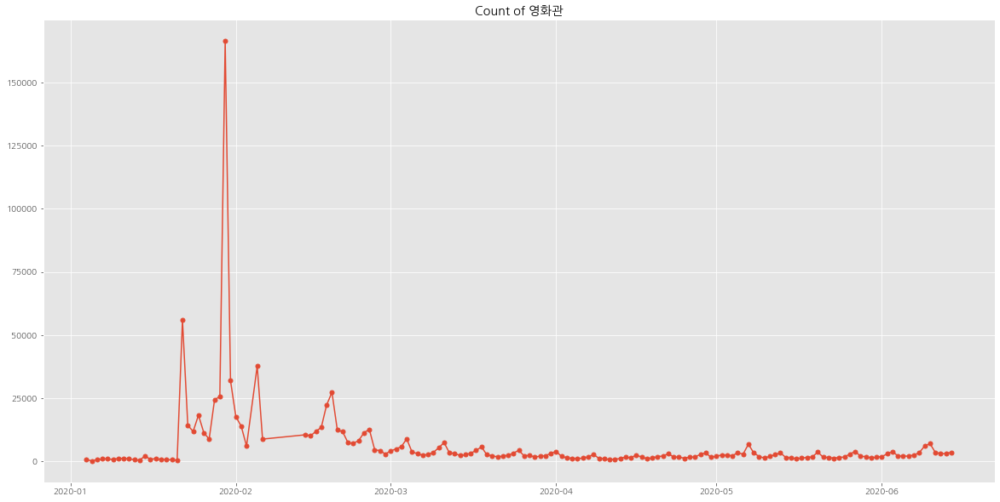

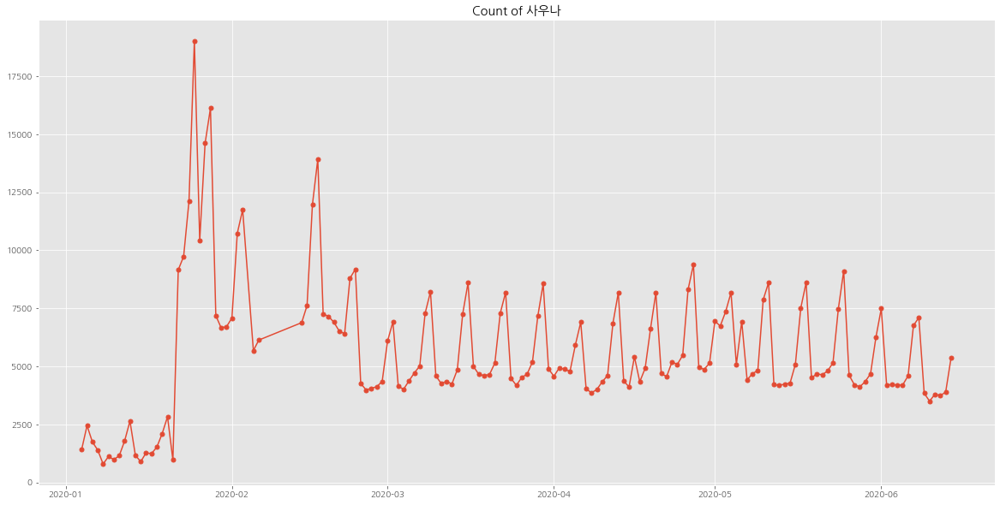

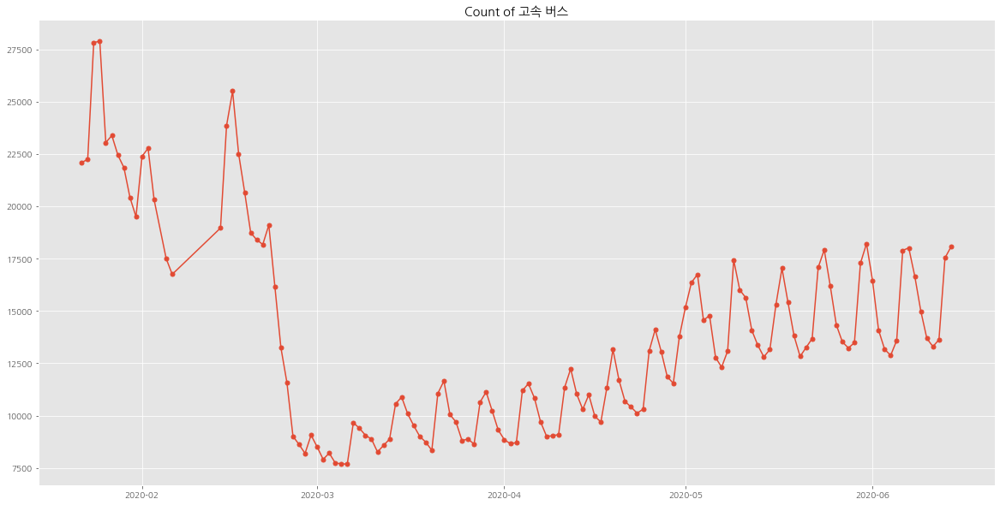

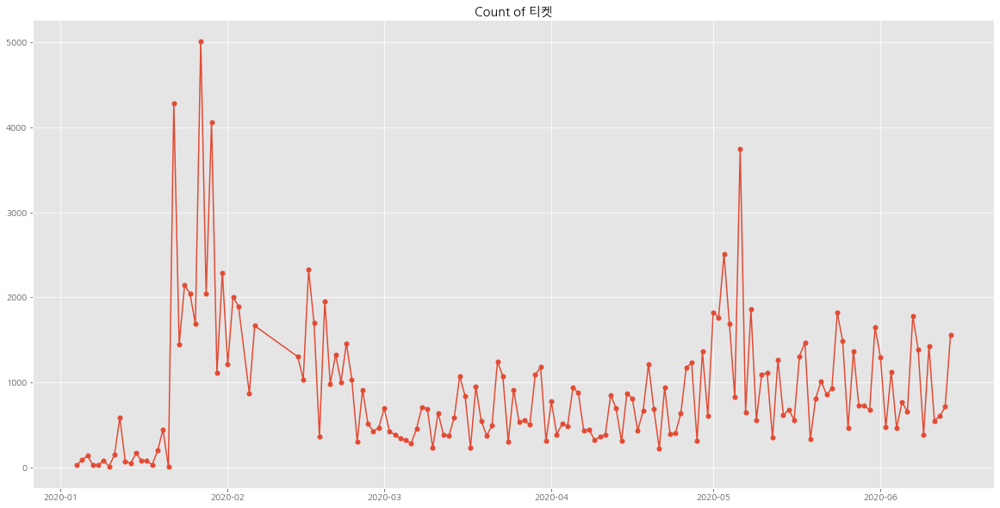

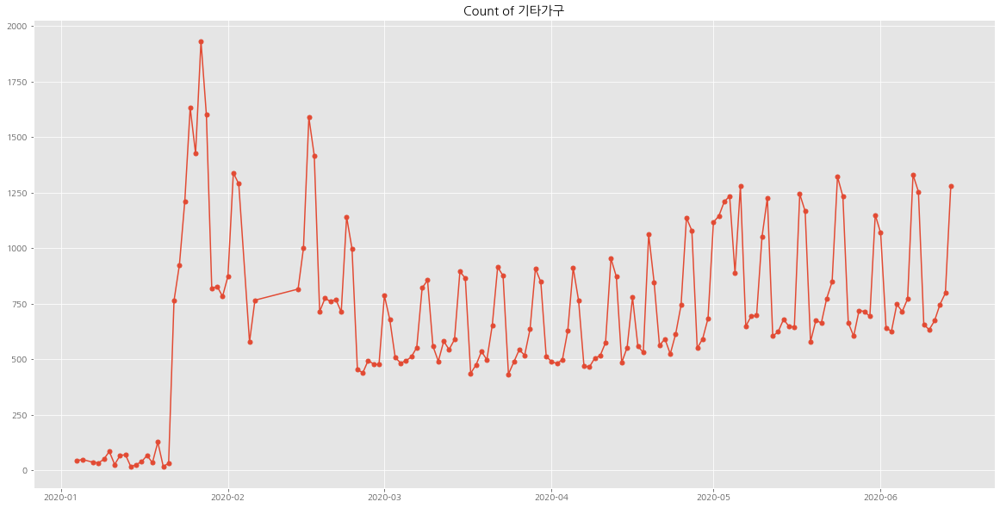

...

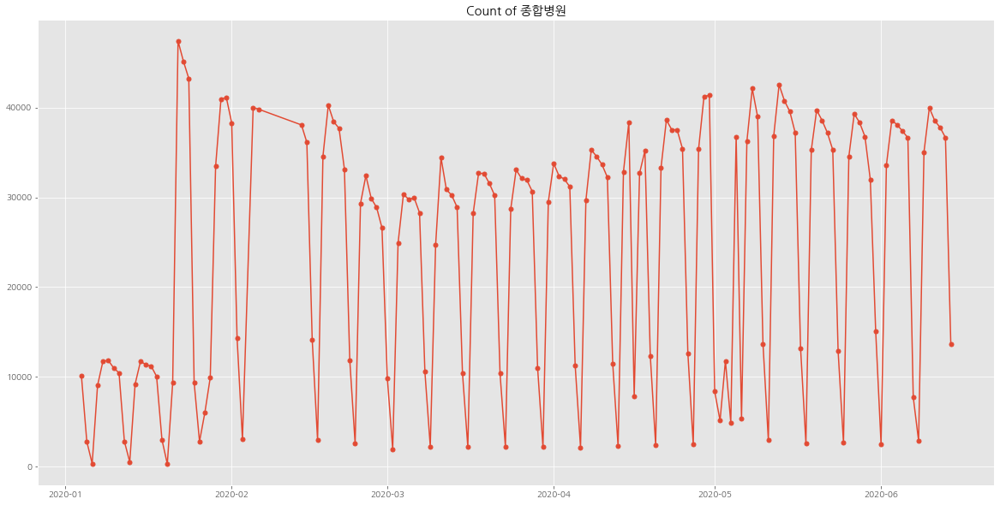

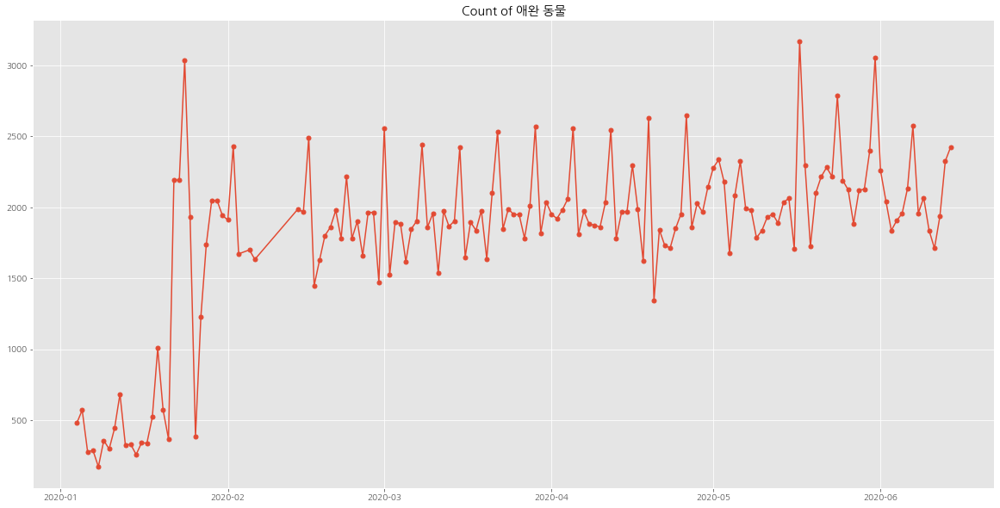

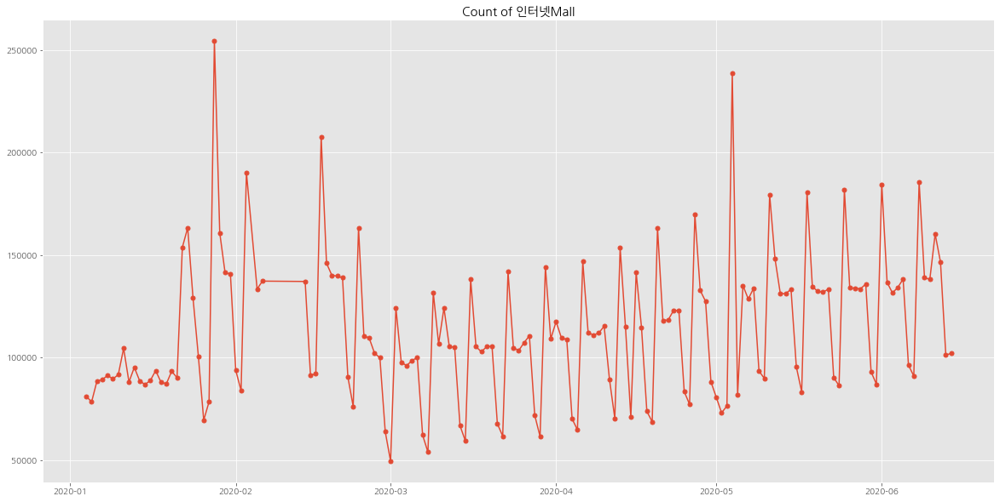

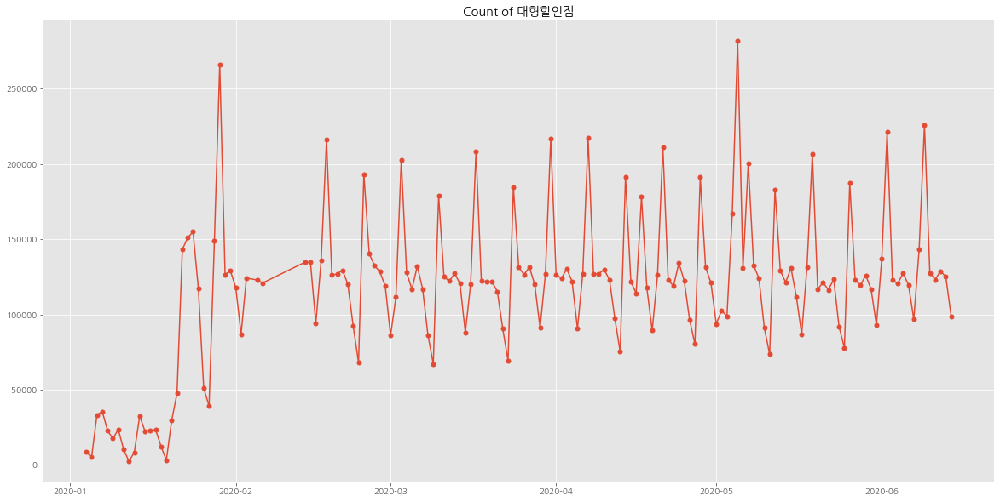

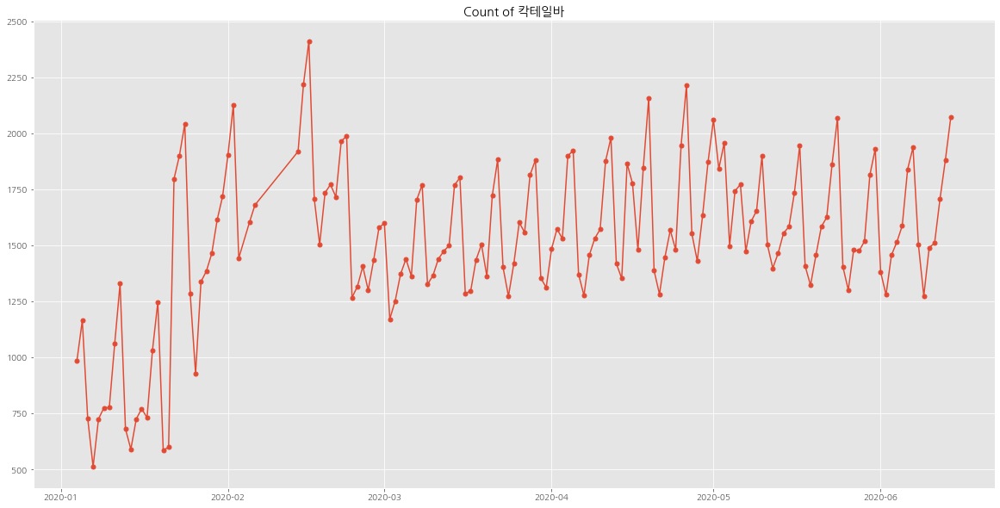

In [49]:
# 인터넷, 조세서비스, 통신요금 등등 특정 주기로 카드값을 지불하는 가맹점을 제외하고 명절기간에 의미있게 증가하는 리스트
# 이 리스트에 포함된 가맹점별 카테고리가 마찬가지로 추석기간에도 이용률이 높을 것이라고 예상할 수 있음

List_new = ['영화관','사우나','고속 버스','티켓','기타가구','정 육 점','농축수산품','특급 호텔','기타레져업'
            ,'철   도','주 유 소','자사카드발행백화점','여 객 선','당구장','슈퍼 마켓','종합병원','애완 동물'
            ,'인터넷Mall','대형할인점','칵테일바']

for i in List_new:
    card_store = card[card['Store']== i ]

    card_store_new = card_store[['Date','Store','Count']]
    card_store_new[['Date']] = card_store_new[['Date']].applymap(str).applymap(lambda x: "{}-{}-{}".format(x[0:4], x[4:6], x[6:]))

    card_store_new['Day'] = pd.to_datetime(card_store_new['Date'])
    card_store_new.drop('Date', axis=1, inplace=True)

    card_store_sum = card_store_new['Count'].groupby([card_store_new['Day']]).sum()
    card_store_sum = pd.DataFrame(card_store_sum)

    plt.figure(figsize=(20,10))
    plt.style.use('ggplot')
    plt.title('Count of {0}'.format(i))
    plt.plot(card_store_sum, marker='o', markersize=5)

In [50]:
# 그래프를 통해 판단한 변화율이 높은 리스트: 영화관 / 사우나 / 여객운수 / 문화 / 식료품 / 백화점 / 호텔 / 당구장 / 주유소 / 병원

# 명절전: 병원 / 동물병원 / 대형할인점 / 슈퍼마켓 / 백화점 / 철도 / 주유소
# 명절중: 사우나 / 당구장 / 여객선 / 티켓 / 영화관 / 기타가구
# 명절후: 대형할인점 / 백화점 / 철도 / 주유소 / 영화관

# 이와 마찬가지로, 추석 기간에도 이용률이 높아질 가맹점들을 예상할 수 있음

In [51]:
card_big.head()

,Store,Count,Day
0,인터넷P/G,366,2020-01-04
1,인터넷P/G,1464,2020-01-04
2,인터넷P/G,26808,2020-01-04
3,인터넷P/G,7980,2020-01-04
4,인터넷P/G,4932,2020-01-04


In [52]:
card_big = card_big.set_index(['Day'])
card_big.head()

,Store,Count
Day,,
2020-01-04,인터넷P/G,366
2020-01-04,인터넷P/G,1464
2020-01-04,인터넷P/G,26808
2020-01-04,인터넷P/G,7980
2020-01-04,인터넷P/G,4932


In [53]:
##### part 4 #####
# 강력한 거리두기기간
# 확진자가 증가함에 따라 정부에서 시행한 강력한 거리두기기간(3월 22일부터 4월 19일)에 따른 가맹점별 카테고리마다의 이용률 분석

card_big_first = card_big.loc['2020-03-22':'2020-04-19']
card_big_first = card_big_first.reset_index()
card_big_first.head()

,Day,Store,Count
0,2020-03-22,인터넷P/G,4052
1,2020-03-22,인터넷P/G,184884
2,2020-03-22,인터넷P/G,134
3,2020-03-22,인터넷P/G,134
4,2020-03-22,인터넷P/G,46090


In [54]:
card_big_first_a = card_big_first.drop(['Day'],axis=1)
card_big_first_sum = pd.DataFrame(card_big_first_a['Count'].groupby([card_big_first_a['Store']]).sum())
card_big_first_sum = card_big_first_sum.rename({'Count':'Count_Seol'}, axis='columns')
card_big_first_sum = card_big_first_sum.sort_values(by=['Count_Seol'],ascending=False).reset_index()
card_big_first_sum['Count_Seol_Mean']=card_big_first_sum['Count_Seol']/len(card_big_first['Day'].value_counts())

In [55]:
# 생활속 거리두기기간
# 확진자가 줄어듦에 따라 정부에서 시행한 생확속 거리두기기간(5월 6일부터 6월 28일)중 중간기간인
# 5월 15일부터 6월 15일까지 1달 가량의 가맹점별 카테고리마다의 이용률 분석

card_big_second = card_big.loc['2020-05-15':'2020-06-15']
card_big_second = card_big_second.reset_index()
card_big_second.head()

,Day,Store,Count
0,2020-05-15,인터넷P/G,33239
1,2020-05-15,인터넷P/G,206427
2,2020-05-15,인터넷P/G,265
3,2020-05-15,인터넷P/G,9731
4,2020-05-15,인터넷P/G,12


In [56]:
#강력한 거리두기기간동안 매출이 평균보다 높았던 상위리스트

card_vs_first = pd.merge(card_big_sum,card_big_first_sum, on='Store')
card_vs_first['Std'] = (card_vs_first['Count_Seol_Mean']-card_vs_first['Count_Mean'])/card_vs_first['Count_Mean']
card_vs_first = card_vs_first.sort_values(by=['Std'],ascending=False)
card_vs_first.head(20)

,index,Store,Count,Count_Mean,Count_Seol,Count_Seol_Mean,Std
115,115,위성방송,113234,730.541935,28394,979.103448,0.340243
82,82,학습지교육,259290,1672.838710,61865,2133.275862,0.275243
98,98,골프연습장,177845,1147.387097,42384,1461.517241,0.273779
76,76,장례서비스,343812,2218.141935,79479,2740.655172,0.235563
13,13,구내매점(국가기관등),10456407,67460.690323,2409376,83081.931034,0.231561
56,56,세탁소,840653,5423.567742,188478,6499.241379,0.198333
50,50,통신판매(일반),1076889,6947.670968,240431,8290.724138,0.193310
33,33,공공요금/대상,2267714,14630.412903,497958,17170.965517,0.173649
35,35,화물 운송,2021681,13043.103226,443383,15289.068966,0.172196
73,73,동물병원,361209,2330.380645,77713,2679.758621,0.149923


In [57]:
# 강력한 거리두기가 시행됨에 따라, 비교적 가정에서 이용할 수 있는 활동이 되는
# 위성방송, 학습지교육, 정수기 등의 이용률이 올라감
# 또한, 마스크와 관련하여 약국의 이용률이 올라갔다고 판단할 수 있음

In [58]:
# 강력한 거리두기기간동안 매출이 평균보다 낮았던 상위리스트

card_vs_first = card_vs_first.sort_values(by=['Std'])
card_vs_first.head(20)

,index,Store,Count,Count_Mean,Count_Seol,Count_Seol_Mean,Std
52,52,영화관,940426,6067.264516,58629,2021.689655,-0.666787
68,68,항 공 사,439718,2836.890323,40243,1387.689655,-0.510841
83,83,유흥주점,258671,1668.845161,26588,916.827586,-0.450622
100,100,헬스 크럽,172221,1111.103226,18413,634.931034,-0.428558
114,114,예체능학원,113355,731.322581,13018,448.896552,-0.386185
60,60,유아원,571912,3689.754839,66930,2307.931034,-0.374503
99,99,기타용역서비스,176173,1136.600000,20839,718.586207,-0.367776
97,97,단란주점,179581,1158.587097,24019,828.241379,-0.285128
107,107,티켓,141856,915.200000,19543,673.896552,-0.263662
53,53,노래방,878709,5669.090323,129083,4451.137931,-0.214841


In [59]:
# 영화관, 항공사, 헬스클럽, 유흥업소, 학원 등 사람들이 많이 모일 수 있는 실내 공간의 이용률이 확실히 감소한 것을 볼 수 있음

In [60]:
# 강력한 거리두기기간동안 매출이 평균보다 높/낮았던 상위리스트 시각화

card_real_first = card_vs_first[abs(card_vs_first['Std']) > 0.15]
List_first = list(card_real_first['Store'])
List_first

['영화관',
 '항 공 사',
 '유흥주점',
 '헬스 크럽',
 '예체능학원',
 '유아원',
 '기타용역서비스',
 '단란주점',
 '티켓',
 '노래방',
 '조세서비스(특약)',
 '기타의류',
 '고속 버스',
 '화물 운송',
 '공공요금/대상',
 '통신판매(일반)',
 '세탁소',
 '구내매점(국가기관등)',
 '장례서비스',
 '골프연습장',
 '학습지교육',
 '위성방송']

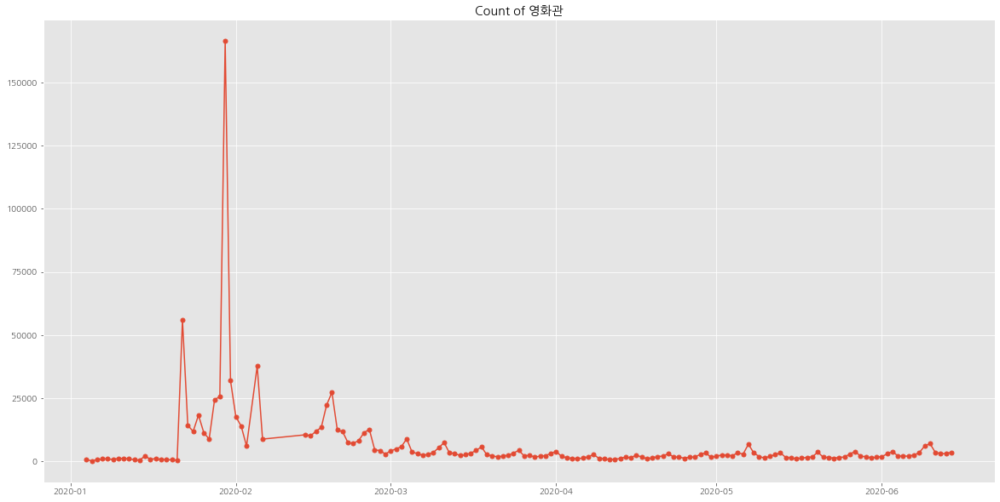

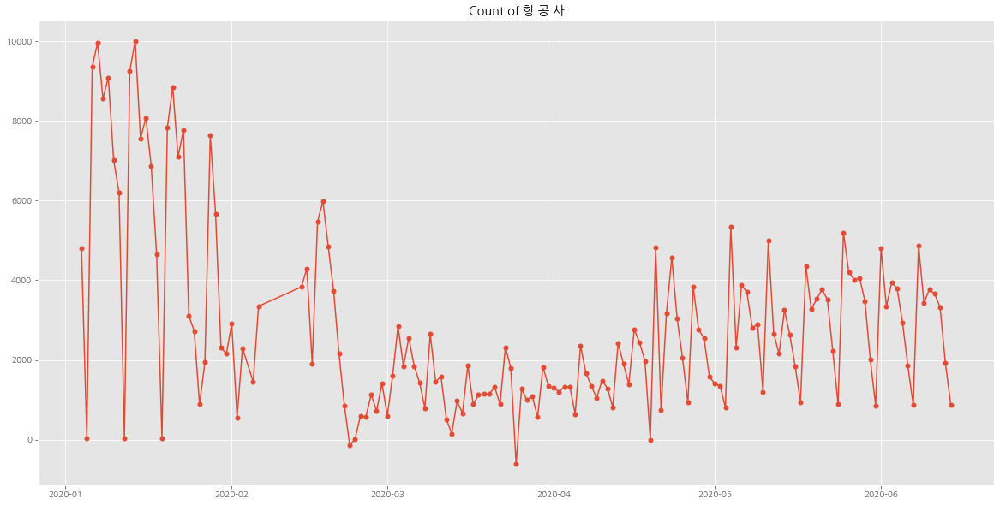

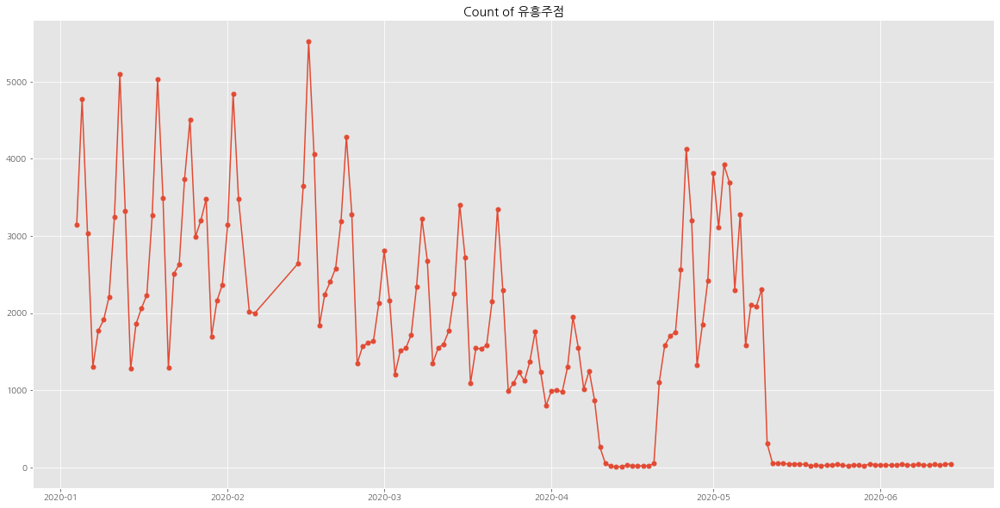

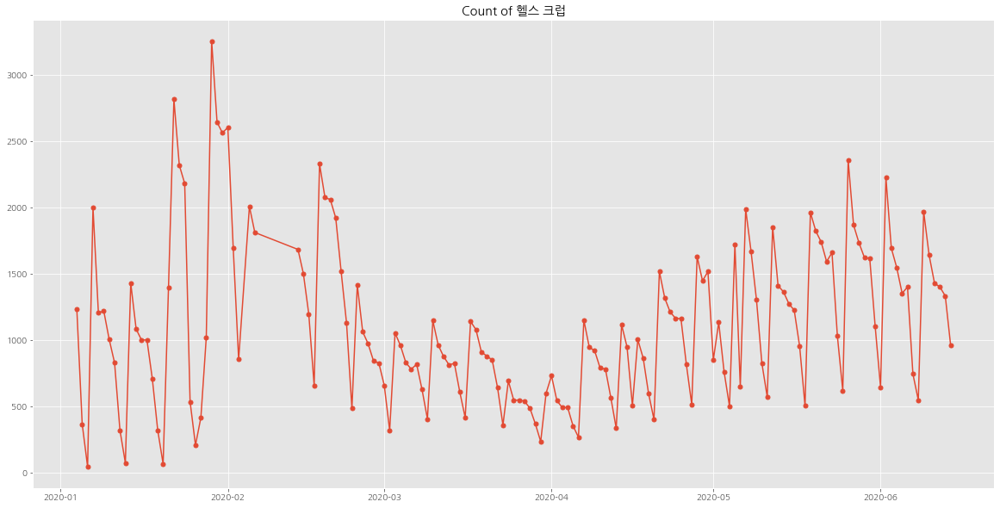

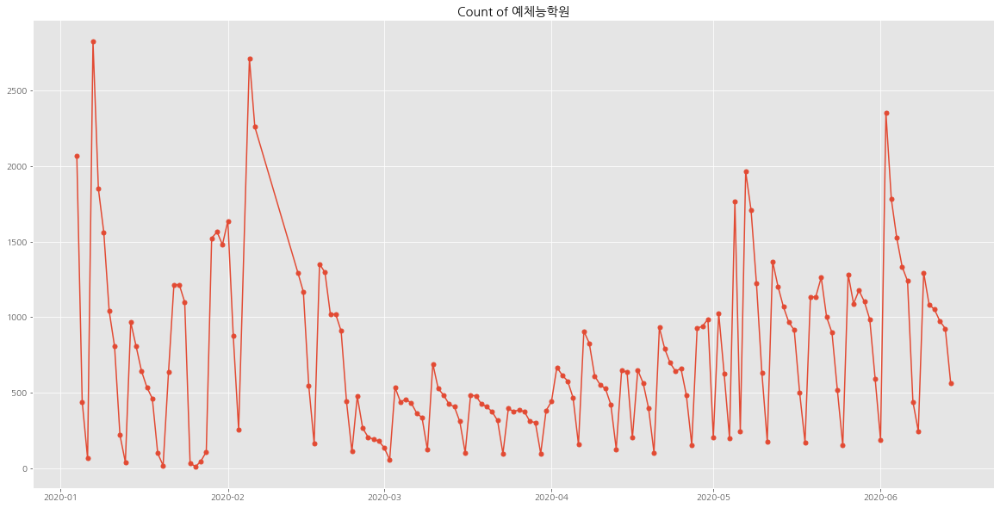

...

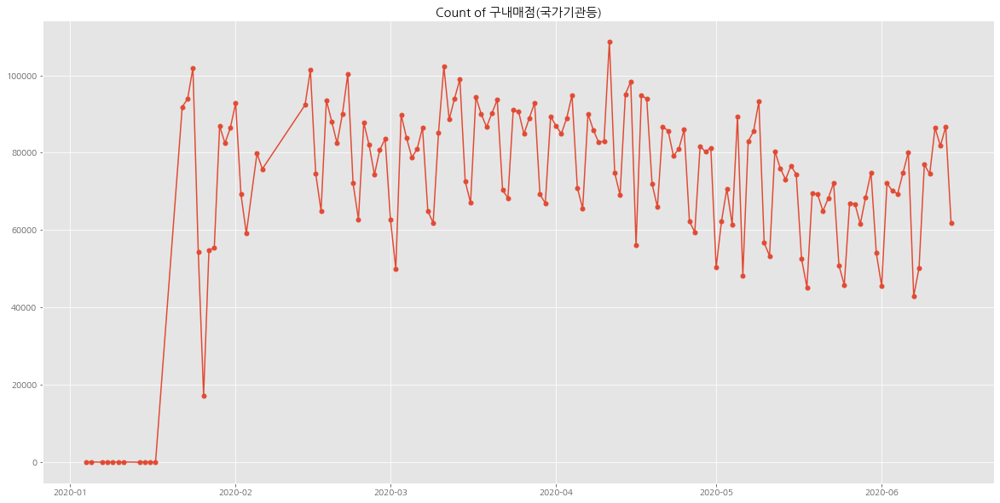

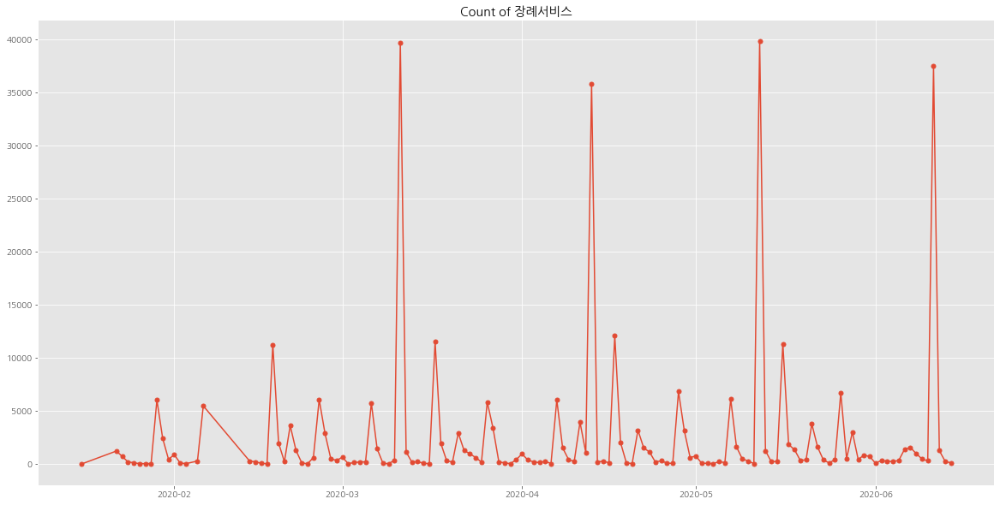

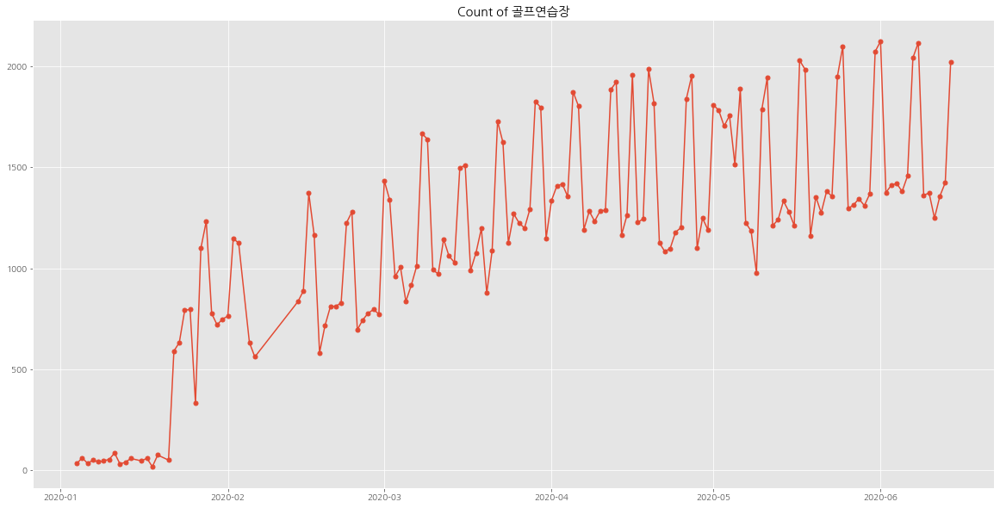

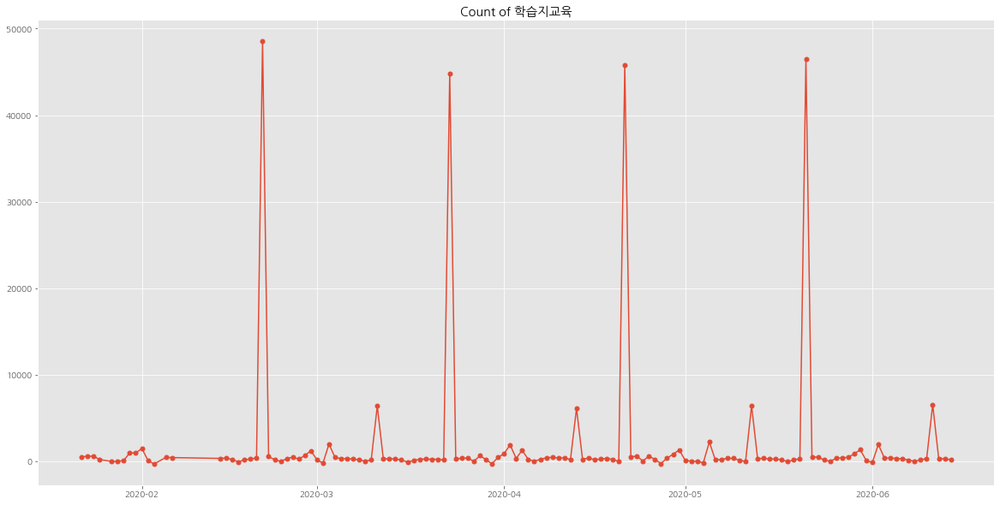

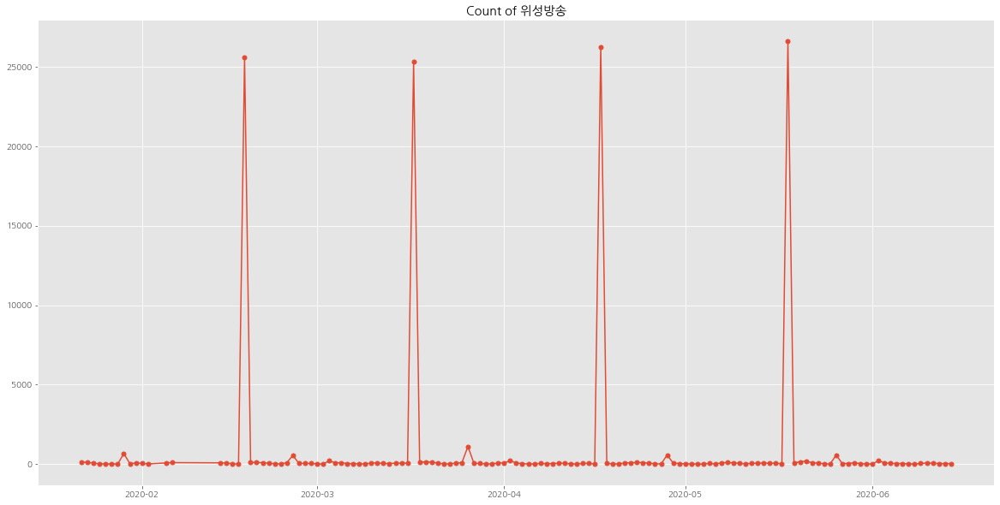

In [61]:
for i in List_first:
    card_store = card[card['Store']== i ]

    card_store_new = card_store[['Date','Store','Count']]
    card_store_new[['Date']] = card_store_new[['Date']].applymap(str).applymap(lambda x: "{}-{}-{}".format(x[0:4], x[4:6], x[6:]))

    card_store_new['Day'] = pd.to_datetime(card_store_new['Date'])
    card_store_new.drop('Date', axis=1, inplace=True)

    card_store_sum = card_store_new['Count'].groupby([card_store_new['Day']]).sum()
    card_store_sum = pd.DataFrame(card_store_sum)

    plt.figure(figsize=(20,10))
    plt.style.use('ggplot')
    plt.title('Count of {0}'.format(i))
    plt.plot(card_store_sum, marker='o', markersize=5)

In [62]:
card_big_second_a = card_big_second.drop(['Day'],axis=1)
card_big_second_sum = pd.DataFrame(card_big_second_a['Count'].groupby([card_big_second_a['Store']]).sum())
card_big_second_sum = card_big_second_sum.rename({'Count':'Count_Seol'}, axis='columns')
card_big_second_sum = card_big_second_sum.sort_values(by=['Count_Seol'],ascending=False).reset_index()
card_big_second_sum['Count_Seol_Mean']=card_big_second_sum['Count_Seol']/len(card_big_second['Day'].value_counts())

In [63]:
# 생활속 거리두기기간동안 매출이 평균보다 높았던 상위리스트

card_vs_second = pd.merge(card_big_sum,card_big_second_sum, on='Store')
card_vs_second['Std'] = (card_vs_second['Count_Seol_Mean']-card_vs_second['Count_Mean'])/card_vs_second['Count_Mean']
card_vs_second = card_vs_second.sort_values(by=['Std'],ascending=False)
card_vs_second.head(20)

,index,Store,Count,Count_Mean,Count_Seol,Count_Seol_Mean,Std
118,118,신 발,102764,662.993548,36660,1182.580645,0.783699
101,101,사무 기기,168489,1087.025806,56861,1834.225806,0.687380
81,81,내의판매점,270073,1742.406452,90976,2934.709677,0.684285
102,102,기타의류,166345,1073.193548,55138,1778.645161,0.657339
86,86,컴 퓨 터,236474,1525.638710,69185,2231.774194,0.462846
46,46,철 도,1287378,8305.664516,365678,11796.064516,0.420243
79,79,여 객 선,297454,1919.058065,84114,2713.354839,0.413899
44,44,스포츠레져용품,1364711,8804.587097,383418,12368.322581,0.404759
112,112,주방 용구,115395,744.483871,32282,1041.354839,0.398761
34,34,정장,2213210,14278.774194,615765,19863.387097,0.391113


In [64]:
# 생활속 거리두기기간동안 매출이 평균보다 낮았던 상위리스트
card_vs_second = card_vs_second.sort_values(by=['Std'])
card_vs_second.head(20)

,index,Store,Count,Count_Mean,Count_Seol,Count_Seol_Mean,Std
83,83,유흥주점,258671,1668.845161,986,31.806452,-0.980941
52,52,영화관,940426,6067.264516,82392,2657.806452,-0.561943
45,45,조세서비스(특약),1317554,8500.348387,189626,6116.967742,-0.280386
53,53,노래방,878709,5669.090323,136519,4403.838710,-0.223184
18,18,기타레져업,7630200,49227.096774,1359306,43848.580645,-0.109259
51,51,공공 요금,957685,6178.612903,173029,5581.580645,-0.096629
61,61,특급 호텔,559507,3609.722581,101187,3264.096774,-0.095749
93,93,조세서비스,195470,1261.096774,35653,1150.096774,-0.088019
54,54,사우나,874782,5643.754839,160933,5191.387097,-0.080154
60,60,유아원,571912,3689.754839,109660,3537.419355,-0.041286


In [65]:
# 생활속 거리두기로 전환하였지만, 코로나에 대한 두려움으로 유흥주점, 영화관, 노래방, 사우나 등 실내 활동과 관련된 가맹점 카테고리는 여전히 매출이 낮음을 확인

In [66]:
# 생활속 거리두기기간동안 매출이 평균보다 매우 낮았던 상위리스트
card_real_second = card_vs_second[card_vs_second['Std'] < -0.10]
List_second = list(card_real_second['Store'])
List_second

['유흥주점', '영화관', '조세서비스(특약)', '노래방', '기타레져업']

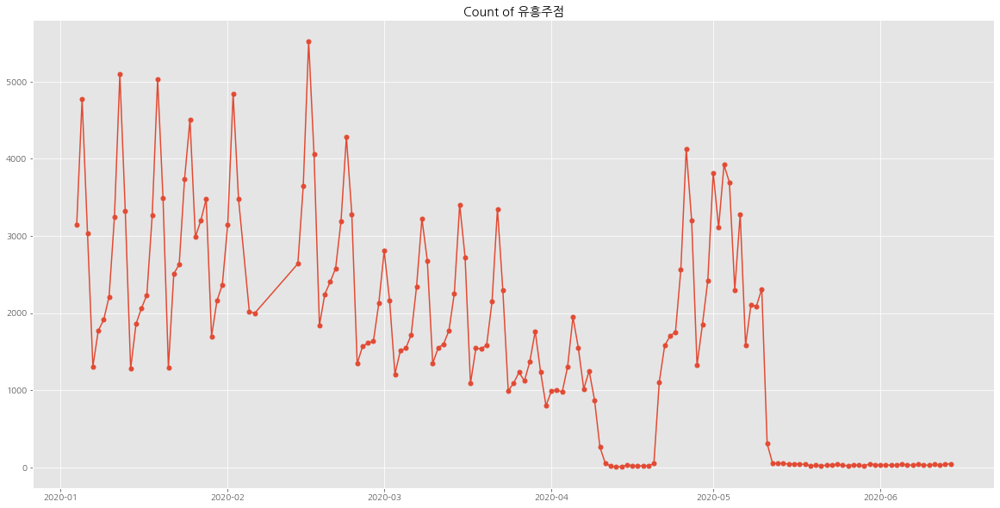

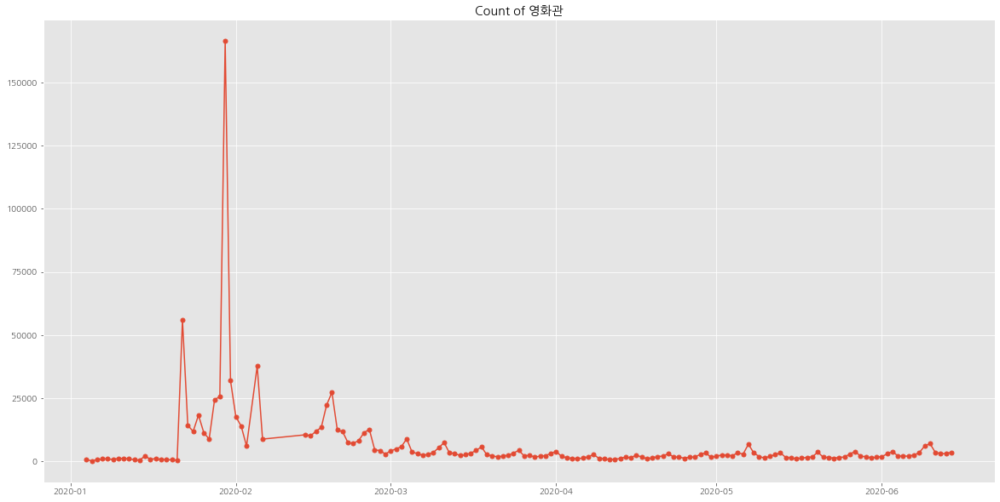

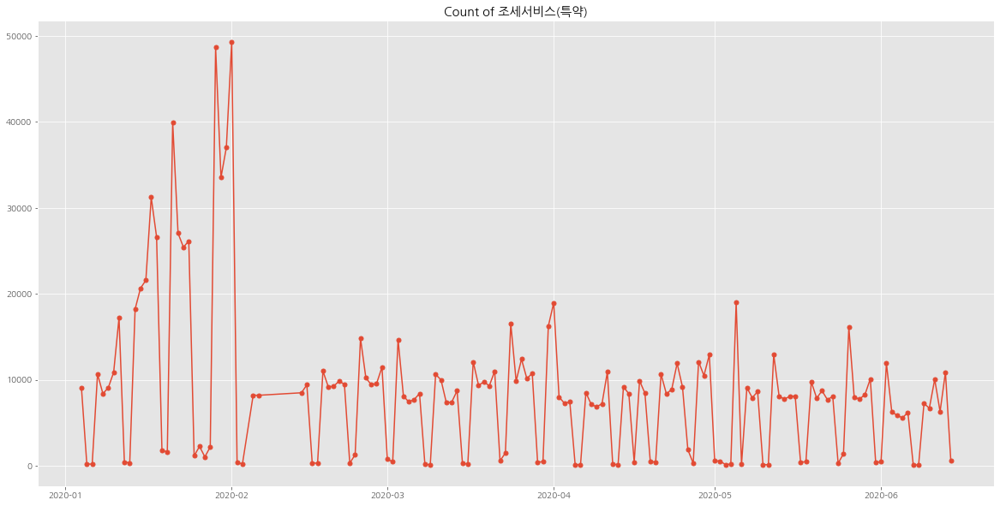

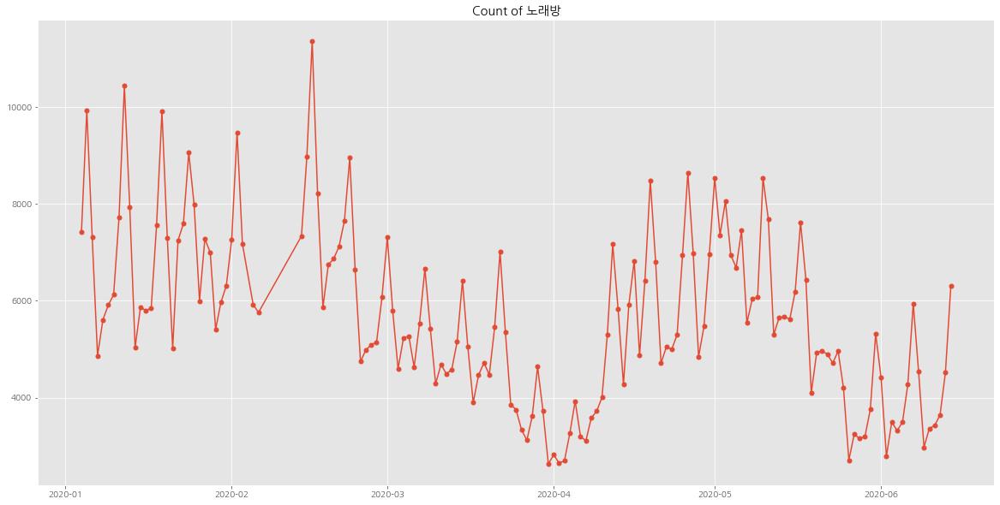

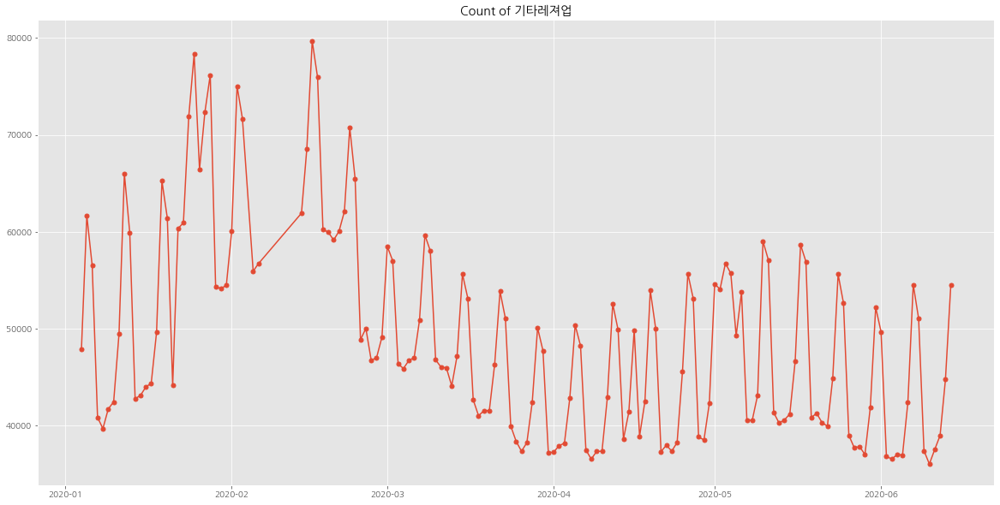

In [67]:
# 생활속 거리두기로 거리두기 단계를 약간 낮췄음에도 유흥주점, 영화관, 노래방, 레져업 등은 이용률이 평소에 비해 매우 떨어짐
# 이 가맹점별 카테고리에 따라서 시각화

for i in List_second:
    card_store = card[card['Store']== i ]

    card_store_new = card_store[['Date','Store','Count']]
    card_store_new[['Date']] = card_store_new[['Date']].applymap(str).applymap(lambda x: "{}-{}-{}".format(x[0:4], x[4:6], x[6:]))

    card_store_new['Day'] = pd.to_datetime(card_store_new['Date'])
    card_store_new.drop('Date', axis=1, inplace=True)

    card_store_sum = card_store_new['Count'].groupby([card_store_new['Day']]).sum()
    card_store_sum = pd.DataFrame(card_store_sum)

    plt.figure(figsize=(20,10))
    plt.style.use('ggplot')
    plt.title('Count of {0}'.format(i))
    plt.plot(card_store_sum, marker='o', markersize=5)

In [69]:
#####part 5#####
# 20년 3월 5일부터 20년 9월 24일까지 경기도 지역내 확진자수 데이터 파일 로드

numbers = pd.read_csv('경기도확진자수.csv')

In [70]:
# 확진자 수를 예측하는데 필요한 변수만 추출

numbers.columns=['날짜','확진자수']
numbers

,날짜,확진자수
0,2020. 9. 24.,27
1,2020. 9. 23.,45
2,2020. 9. 22.,32
3,2020. 9. 21.,17
4,2020. 9. 20.,19
...,...,...
216,2020. 2. 5.,2
217,2020. 2. 2.,2
218,2020. 2. 1.,1
219,2020. 1. 27.,1


In [71]:
#날짜를 데이트타임형식의 데이터 구조로 변환

numbers["날짜"] = pd.to_datetime(numbers["날짜"], format = '%Y. %m. %d.')

In [72]:
numbers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 221 entries, 0 to 220
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   날짜      221 non-null    datetime64[ns]
 1   확진자수    221 non-null    int64         
dtypes: datetime64[ns](1), int64(1)
memory usage: 3.6 KB


In [135]:
# 산업공학적 지식을 활용하여, 미래예측에 쓰이는 지수평활법(expenential smoothing)을 활용한 확진자수 예측
# a는 0.05에서 0.3사이의 값으로 설정하는데, 현재 확진자수 그래프에 fitting 시킨 결과 0.2정도가 가장 정확하게 데이터와 일치함
# 따라서, a = 0.2로 설정하여 지수평활법을 진행

a=0.2
def 지수평활(list):
    pre=[]
    for i in range(len(list)):
        p = a*((1-a)**(len(list)-1-i))*list[i]
        pre.append(p)
    return sum(pre)

In [ ]:
# 지수평활을 통하여 24일 이후 10일 동안의 확진자 수를 예측
# fitting한 결과에 따라서 0.2가 평균이 되고, 감염 위험이 작을때는 0.05, 클때는 0.3정도 이므로 세 개의 a값에 따라 모델 3개를 만들어서
# 앙상블 기법을 활용하여 평균을 냄

In [108]:
#9월30일: 18, 10월1일:17, 10월2일:16, 10월3일:16, 10월4일:15 

In [ ]:
##### part 6 #####
# 2019년 교통량 데이터를 활용하여, 명절 기간에 교통량이 어느정도 증가할 것인지에 대해 예측

### 추석 또는 연휴 기간동안의 교통량 증가율을 알아보기 위하여 작년 교통량 데이터를 활용


In [84]:
data=pd.read_csv("TCS_D3_04_04_888332.csv", encoding='CP949')
data.head()

,일자,영업소명,방향구분,영업소코드,기점종점방향구분코드,당일교통량,전주교통량,전전주교통량,전월평균교통량,전년동주교통량,전년평균교통량
0,20190102.0,구리남양주,서울방향,6.0,2.0,93775.0,98074.0,99906.0,96135.0,0.0,99867.0
1,20190103.0,구리남양주,서울방향,6.0,2.0,98413.0,97745.0,100088.0,96135.0,0.0,99867.0
2,20190104.0,구리남양주,서울방향,6.0,2.0,101327.0,103745.0,107940.0,96135.0,0.0,99867.0
3,20190105.0,구리남양주,서울방향,6.0,2.0,92325.0,90912.0,99186.0,96135.0,0.0,99867.0
4,20190106.0,구리남양주,서울방향,6.0,2.0,71582.0,74171.0,78815.0,96135.0,0.0,99867.0


In [87]:
# 교통량 데이터에 존재하는 결측치 제거 

data=data.dropna(axis=0)
data.isnull().sum()

일자             0
 영업소명          0
 방향구분          0
영업소코드          0
 기점종점방향구분코드    0
 당일교통량         0
 전주교통량         0
 전전주교통량        0
 전월평균교통량       0
 전년동주교통량       0
 전년평균교통량       0
dtype: int64

In [88]:
data.columns=data.columns.str.strip()
data.columns

Index(['일자', '영업소명', '방향구분', '영업소코드', '기점종점방향구분코드', '당일교통량', '전주교통량', '전전주교통량',
       '전월평균교통량', '전년동주교통량', '전년평균교통량'],
      dtype='object')

In [89]:
# 교통량 데이터에 존재하는 모든 변수 타입을 정수형으로 변환

data=data.astype({'일자':int,
                  '영업소코드':int, 
                  '기점종점방향구분코드':int, 
                  '당일교통량':int,
                  '전주교통량':int,
                  '전전주교통량':int, 
                  '전월평균교통량':int, 
                  '전년동주교통량':int,
                  '전년평균교통량':int})
data.head(3)

,일자,영업소명,방향구분,영업소코드,기점종점방향구분코드,당일교통량,전주교통량,전전주교통량,전월평균교통량,전년동주교통량,전년평균교통량
0,20190102,구리남양주,서울방향,6,2,93775,98074,99906,96135,0,99867
1,20190103,구리남양주,서울방향,6,2,98413,97745,100088,96135,0,99867
2,20190104,구리남양주,서울방향,6,2,101327,103745,107940,96135,0,99867


In [90]:
total=data.drop([ '방향구분', '영업소코드', '기점종점방향구분코드', '전년동주교통량', '전년평균교통량'], axis=1)

# 일자로 groupby. (영업소 구분x)
total=total.groupby(['일자']).sum()
total.head(3)

,당일교통량,전주교통량,전전주교통량,전월평균교통량
일자,,,,
20190101,4355834,3997928,5019709,4965918
20190102,723906,752770,751342,744298
20190103,4853805,4965393,5121436,4965918


In [91]:
# 작년 추석 기간의 실제적인 교통량 분석

date=range(20190911,20190916)

chuseok19 = total.loc[date]
chuseok19

,당일교통량,전주교통량,전전주교통량,전월평균교통량
일자,,,,
20190911,5773125,4950710,5322642,5447679
20190912,5764190,5052335,5299278,5447679
20190913,7017734,5587281,5882335,5447679
20190914,5858019,3602932,6138893,5447679
20190915,4657033,4431920,5418702,5447679


In [92]:
# 추석 기간 동안의 교통량 증가율 

chuseok19['전주rate']=(chuseok19['당일교통량']-chuseok19['전주교통량'])/chuseok19['전주교통량']*100
chuseok19['전전주rate']=(chuseok19['당일교통량']-chuseok19['전전주교통량'])/chuseok19['전전주교통량']*100
chuseok19['전월평균rate']=(chuseok19['당일교통량']-chuseok19['전월평균교통량'])/chuseok19['전월평균교통량']*100
chuseok19

,당일교통량,전주교통량,전전주교통량,전월평균교통량,전주rate,전전주rate,전월평균rate
일자,,,,,,,
20190911,5773125,4950710,5322642,5447679,16.612062,8.463522,5.974030
20190912,5764190,5052335,5299278,5447679,14.089624,8.773120,5.810016
20190913,7017734,5587281,5882335,5447679,25.601952,19.301842,28.820623
20190914,5858019,3602932,6138893,5447679,62.590329,-4.575320,7.532382
20190915,4657033,4431920,5418702,5447679,5.079356,-14.056300,-14.513447


In [ ]:
# 추석 연휴 마지막날인 19년 9월 15일을 제외하면 전체적으로 증가하였고, 특히, 추석 당일날은 30% 가량 크게 증가한 것을 볼 수 있음
# 따라서, 교통량이 늘어남에 따라 자연스럽게 휴게소의 이용률도 증가할 것으로 예상됨

In [93]:
# 2018년도 추석기간에 따른 교통량 분석

data18=pd.read_csv("TCS_D3_04_04_585131.csv", encoding='CP949')
data18.head()

,일자,영업소명,방향구분,영업소코드,기점종점방향구분코드,당일교통량,전주교통량,전전주교통량,전월평균교통량,전년동주교통량,전년평균교통량
0,20180104.0,구리남양주,서울방향,6.0,2.0,98222.0,101302.0,92920.0,94859.0,102826.0,103854.0
1,20180110.0,구리남양주,서울방향,6.0,2.0,93010.0,97818.0,99758.0,94859.0,102730.0,103854.0
2,20180101.0,구리남양주,서울방향,6.0,2.0,78055.0,75696.0,80035.0,94859.0,97479.0,103854.0
3,20180101.0,구리남양주,지방방향,6.0,3.0,77987.0,79411.0,75121.0,92163.0,98167.0,99595.0
4,20180111.0,구리남양주,서울방향,6.0,2.0,94480.0,98222.0,101302.0,94859.0,102869.0,103854.0


In [94]:
# 결측치 제거하여 교통량 데이터 전처리

data18=data18.dropna(axis=0)
data18.isnull().sum()

일자             0
 영업소명          0
 방향구분          0
영업소코드          0
 기점종점방향구분코드    0
 당일교통량         0
 전주교통량         0
 전전주교통량        0
 전월평균교통량       0
 전년동주교통량       0
 전년평균교통량       0
dtype: int64

In [95]:
# 데이터 형식을 정수형으로 모두 변환

data18.columns=data18.columns.str.strip()
data18=data18.astype({'일자':int,
                  '영업소코드':int, 
                  '기점종점방향구분코드':int, 
                  '당일교통량':int,
                  '전주교통량':int,
                  '전전주교통량':int, 
                  '전월평균교통량':int, 
                  '전년동주교통량':int,
                  '전년평균교통량':int})
data18.head(3)

,일자,영업소명,방향구분,영업소코드,기점종점방향구분코드,당일교통량,전주교통량,전전주교통량,전월평균교통량,전년동주교통량,전년평균교통량
0,20180104,구리남양주,서울방향,6,2,98222,101302,92920,94859,102826,103854
1,20180110,구리남양주,서울방향,6,2,93010,97818,99758,94859,102730,103854
2,20180101,구리남양주,서울방향,6,2,78055,75696,80035,94859,97479,103854


In [96]:
total=data18.drop([ '방향구분', '영업소코드', '기점종점방향구분코드', '전년동주교통량', '전년평균교통량'], axis=1)

# 일자로 groupby. (영업소 구분x)
total=total.groupby(['일자']).sum()
total.head(3)

,당일교통량,전주교통량,전전주교통량,전월평균교통량
일자,,,,
20180101,668066,628662,629244,726250
20180102,715616,747577,715435,726250
20180103,720986,734243,702526,726250


- 2018년 추석 연휴 23~26. 추석당일 24일, 대체휴일 26일

In [97]:
date=range(20180922,20180927)

chuseok18 = total.loc[date]
chuseok18

,당일교통량,전주교통량,전전주교통량,전월평균교통량
일자,,,,
20180922,5172677,5686701,5949574,5188629
20180923,5134913,4976126,5292259,5188629
20180924,6902428,1559715,5354711,5188629
20180925,5946789,5472445,5317505,5188629
20180926,746053,811632,798468,780550


In [98]:
# 2018년도 추석기간의 교통량 증가율 

chuseok18['전주rate']=(chuseok18['당일교통량']-chuseok18['전주교통량'])/chuseok18['전주교통량']*100
chuseok18['전전주rate']=(chuseok18['당일교통량']-chuseok18['전전주교통량'])/chuseok18['전전주교통량']*100
chuseok18['전월평균rate']=(chuseok18['당일교통량']-chuseok18['전월평균교통량'])/chuseok18['전월평균교통량']*100
chuseok18

,당일교통량,전주교통량,전전주교통량,전월평균교통량,전주rate,전전주rate,전월평균rate
일자,,,,,,,
20180922,5172677,5686701,5949574,5188629,-9.039054,-13.058027,-0.307442
20180923,5134913,4976126,5292259,5188629,3.190976,-2.973135,-1.035264
20180924,6902428,1559715,5354711,5188629,342.544183,28.903838,33.029901
20180925,5946789,5472445,5317505,5188629,8.667862,11.834197,14.611952
20180926,746053,811632,798468,780550,-8.079893,-6.564446,-4.419576


In [ ]:
# 2018년에도 마찬가지로 추석 당일 30%이상의 교통량이 증가한 것을 볼 수 있음
# 2019년도와는 다르게 추석 전에 교통량은 크게 변화가 없었고, 추석 다음날에 교통량이 크게 는것을 확인할 수 있음

In [ ]:
##### part 7 #####
# 우리팀만의 코로나 감염위험 확률이 담긴 지수 구하기

In [109]:
# 카드 데이터활용
card_fn = pd.DataFrame(card_new['Count'].groupby([card_new['Day']]).sum())

In [110]:
# 강력한 거리두기 기간 동안의 실내 활동 가맹점 이용률

card_count1 = card_fn.query('Day > "2020-03-22" and Day < "2020-04-19"')

In [111]:
# 강력한 거리두기 기간이 시행된 직 후 2주와, 2주가 지난 후 부터의 가맹점 이용률

a = sum(card_count1.iloc[:14, 0])
b = sum(card_count1.iloc[15:, 0])


print(a,b)

68505046 64479030


In [180]:
# 강력한 거리두기 시행 직후 2주 = sc1
# 강력한 거리두기 시행 2주가 지난 후 = sc2

sc1 = (a) / (a+b)
sc2 = (b) / (a+b)

sc1,sc2

(0.5151372108642541, 0.4848627891357458)

In [181]:
# 생활 속 거리두기 기간이 시행된 직 후 2주와, 2주가 지난 후 부터의 가맹점 이용률

card_count2 = card_fn.query('Day > "2020-05-15" and Day < "2020-06-15"')
c = sum(card_count2.iloc[:14, 0])
d = sum(card_count2.iloc[15:, 0])


print(c,d)

76072113 83622308


In [182]:
# 생활 속 거리두기 시행 직후 2주 = sc1
# 생활 속 거리두기 시행 2주가 지난 후 = sc2

nc1 = (c) / (c+d)
nc2 = (d) / (c+d)

nc1,nc2

(0.4763604922679171, 0.5236395077320829)

In [183]:
# 19년도 교통량 데이터를 통해서 코로나 이후 교통량이 어떻게 변화했는지 확인

DF19_03=pd.read_csv('./traffic/1903.txt', header=None, sep='|',  usecols = range(0,13))
DF19_04=pd.read_csv('./traffic/1904.txt', header=None, sep='|',  usecols = range(0,13))
DF19_05=pd.read_csv('./traffic/1905.txt', header=None, sep='|',  usecols = range(0,13))
DF19_06=pd.read_csv('./traffic/1906.txt', header=None, sep='|',  usecols = range(0,13))
DF19_07=pd.read_csv('./traffic/1907.txt', header=None, sep='|',  usecols = range(0,13))
DF19_08=pd.read_csv('./traffic/1908.txt', header=None, sep='|',  usecols = range(0,13))

In [184]:
DF19_03.columns=["집계일자", "영업소코드", "입출구구분코드", "TCS하이패스구분코드", "고속도로운영기관구분코드", "영업형태구분코드", "1종교통량", "2종교통량", "3종교통량", "4종교통량", "5종교통량", "6종교통량", "총교통량"]
DF19_04.columns=["집계일자", "영업소코드", "입출구구분코드", "TCS하이패스구분코드", "고속도로운영기관구분코드", "영업형태구분코드", "1종교통량", "2종교통량", "3종교통량", "4종교통량", "5종교통량", "6종교통량", "총교통량"]
DF19_05.columns=["집계일자", "영업소코드", "입출구구분코드", "TCS하이패스구분코드", "고속도로운영기관구분코드", "영업형태구분코드", "1종교통량", "2종교통량", "3종교통량", "4종교통량", "5종교통량", "6종교통량", "총교통량"]
DF19_06.columns=["집계일자", "영업소코드", "입출구구분코드", "TCS하이패스구분코드", "고속도로운영기관구분코드", "영업형태구분코드", "1종교통량", "2종교통량", "3종교통량", "4종교통량", "5종교통량", "6종교통량", "총교통량"]
DF19_07.columns=["집계일자", "영업소코드", "입출구구분코드", "TCS하이패스구분코드", "고속도로운영기관구분코드", "영업형태구분코드", "1종교통량", "2종교통량", "3종교통량", "4종교통량", "5종교통량", "6종교통량", "총교통량"]
DF19_08.columns=["집계일자", "영업소코드", "입출구구분코드", "TCS하이패스구분코드", "고속도로운영기관구분코드", "영업형태구분코드", "1종교통량", "2종교통량", "3종교통량", "4종교통량", "5종교통량", "6종교통량", "총교통량"]

In [185]:
t1903 = DF19_03.groupby('집계일자')['총교통량'].sum()
t1904 = DF19_04.groupby('집계일자')['총교통량'].sum()
t1905 = DF19_05.groupby('집계일자')['총교통량'].sum()
t1906 = DF19_06.groupby('집계일자')['총교통량'].sum()
t1907 = DF19_07.groupby('집계일자')['총교통량'].sum()
t1908 = DF19_08.groupby('집계일자')['총교통량'].sum()

In [187]:
# 20년도 교통량 데이터

DF20_03=pd.read_csv('./traffic/2003.csv', header=None, usecols = range(0,13))
DF20_04=pd.read_csv('./traffic/2004.csv', usecols = range(0,13), encoding='CP949')
DF20_05=pd.read_csv('./traffic/2005.csv', usecols = range(0,13), encoding='CP949')
DF20_06=pd.read_csv('./traffic/2006.csv', usecols = range(0,13), encoding='CP949')
DF20_07=pd.read_csv('./traffic/2007.csv', usecols = range(0,13), encoding='CP949')
DF20_08=pd.read_csv('./traffic/2008.csv', usecols = range(0,13), encoding='CP949')

In [188]:
DF20_03.columns=["집계일자", "영업소코드", "입출구구분코드", "TCS하이패스구분코드", "고속도로운영기관구분코드", "영업형태구분코드", "1종교통량", "2종교통량", "3종교통량", "4종교통량", "5종교통량", "6종교통량", "총교통량"]
DF20_04.columns=["집계일자", "영업소코드", "입출구구분코드", "TCS하이패스구분코드", "고속도로운영기관구분코드", "영업형태구분코드", "1종교통량", "2종교통량", "3종교통량", "4종교통량", "5종교통량", "6종교통량", "총교통량"]
DF20_05.columns=["집계일자", "영업소코드", "입출구구분코드", "TCS하이패스구분코드", "고속도로운영기관구분코드", "영업형태구분코드", "1종교통량", "2종교통량", "3종교통량", "4종교통량", "5종교통량", "6종교통량", "총교통량"]
DF20_06.columns=["집계일자", "영업소코드", "입출구구분코드", "TCS하이패스구분코드", "고속도로운영기관구분코드", "영업형태구분코드", "1종교통량", "2종교통량", "3종교통량", "4종교통량", "5종교통량", "6종교통량", "총교통량"]
DF20_07.columns=["집계일자", "영업소코드", "입출구구분코드", "TCS하이패스구분코드", "고속도로운영기관구분코드", "영업형태구분코드", "1종교통량", "2종교통량", "3종교통량", "4종교통량", "5종교통량", "6종교통량", "총교통량"]
DF20_08.columns=["집계일자", "영업소코드", "입출구구분코드", "TCS하이패스구분코드", "고속도로운영기관구분코드", "영업형태구분코드", "1종교통량", "2종교통량", "3종교통량", "4종교통량", "5종교통량", "6종교통량", "총교통량"]

In [189]:
DF20_08=DF20_08.drop(0)
DF20_08.head()

,집계일자,영업소코드,입출구구분코드,TCS하이패스구분코드,고속도로운영기관구분코드,영업형태구분코드,1종교통량,2종교통량,3종교통량,4종교통량,5종교통량,6종교통량,총교통량
1,20200801,11,0,2,0,1,46081,774,328,272,853,2690,50998
2,20200801,11,1,1,0,1,10856,150,277,212,118,1296,12909
3,20200801,11,1,2,0,1,51214,837,368,374,941,3083,56817
4,20200801,12,0,1,0,1,499,8,9,5,2,42,565
5,20200801,12,0,2,0,1,1776,9,14,8,35,37,1879


In [190]:
t2003 = DF20_03.groupby('집계일자')['총교통량'].sum()
t2004 = DF20_04.groupby('집계일자')['총교통량'].sum()
t2005 = DF20_05.groupby('집계일자')['총교통량'].sum()
t2006 = DF20_06.groupby('집계일자')['총교통량'].sum()
t2007 = DF20_07.groupby('집계일자')['총교통량'].sum()
t2008 = DF20_08.groupby('집계일자')['총교통량'].sum()

In [186]:
# 19년도 교통량 

total2019 = t1903.sum() + t1904.sum() + t1905.sum() + t1906.sum() + t1907.sum() + t1908.sum()

In [191]:
# 20년도 교통량 

total2020 = t2003.sum() + t2004.sum() + t2005.sum() + t2006.sum() + t2007.sum() + t2008.sum()

In [192]:
# 코로나 이후 교통량이 5%정도 감소한 것을 확인

total2020/total2019

0.9589084426134551

In [193]:
a = t2003.iloc[22:,].sum() + t2004.iloc[:4,].sum()
b = t2004.iloc[4:18,].sum()

print(a,b)

99150603 106448584


In [194]:
# 강력한 거리두기 시행 직후 2주 및 2주후 동안의 교통량

st1 = (a) / (a+b)
st2 = (b) / (a+b)

st1,st2

(0.4822519215506431, 0.5177480784493569)

In [195]:
c = t2005.iloc[15:,].sum()
d = t2006.iloc[:15,].sum()

print(c,d)

127760422 125734678


In [196]:
# 생활 속 거리두기 기간 시행 직후 2주 및 2주후 동안의 교통량

nt1 = (c) / (c+d)
nt2 = (d) / (c+d)

nt1,nt2

(0.503995627528895, 0.49600437247110496)

In [198]:
# 교통량과 실내활동에 따라서 기간별로 우리팀만의 코로나 감염 위험 지수 정립
# R1 = 강력한 거리두기 시행 첫 2주 동안의 위험률
# R2 = 강력한 거리두기 시행 2주 이후 기간 동안의 위험률
# R3 = 생활 속 거리두기 시행 첫 2주 동안의 위험률
# R4 = 생활 속 거리두기 시행 2주 이후 기간 동안의 위험률

R1 = st1 * sc1 * sf1
R2 = st2 * sc2 * sf2
R3 = nt1 * nc1 * nf1
R4 = nt2 * nc2 * nf2

In [199]:
# 강력한 거리두기 시행 첫 2주는 아직 정책의 효과가 미미하므로 감염 위험률이 비교적 높다.
# 강력한 거리두기 시행 후 2주가 지나면 교통량과 실내활동 등이 감소하며 감염 위험률이 가장 낮게 내려간다.
# 생활속 거리두기 시행 첫 2주는 강력한 거리두기로부터 진행되는 기간이므로 비교적 감염 위험률이 낮다.
# 그러나, 생활속 거리두기를 연장함에 따라, 교통량과 실내활동이 늘어나 감염 위험율이 다시 상당히 올라간다.

print(R1,R2,R3,R4)

0.19865491578256694 0.050294069390067114 0.08048648083660012 0.17265552040293805


In [ ]:
# 이를 토대로, 실내 활동량을 줄이고, 교통량을 감소시켜 유동인구를 줄여야 코로나 감염 위험률을 낮출 수 있을 것이다.